# Libraries and Google Drive

In [2]:
## for data
import pandas as pd
import numpy as np # Used to do data processing

## for plotting
import matplotlib.pyplot as plt
import seaborn as sns

## for statistical tests
import scipy.stats as stats
import statsmodels.formula.api as smf
import statsmodels.api as sm
from statsmodels.tsa.stattools import adfuller # Used to check stationarity


## for machine learning
import sklearn
from sklearn import model_selection, preprocessing, feature_selection, ensemble, linear_model, metrics, decomposition

In [3]:
from DreamLib.visualization import explo_DR, explo_portefeuille, explo_client, explo_habitation, explo_civil, explo_code_qualite, explo_profession, explo_pib, explo_inflation, explo_txcho

Set figure sizes and fonts

In [4]:
sns.set_theme()
sns.set(rc={"figure.figsize":(18, 6)})
plt.rcParams['font.family'] = 'serif'

color: https://matplotlib.org/stable/gallery/color/named_colors.html

# Data importation and formating

In [5]:
# Same link for everyone:
data = pd.read_sas("datas/construct_red.sas7bdat")

In [6]:
data.shape

(78, 82)

In [7]:
data.columns

Index(['TRIMESTRE', 'CHRONIQUE', 'DR', 'mean_1', 'median_1', 'p5_1', 'p10_1',
       'p25_1', 'p75_1', 'p90_1', 'p95_1', 'mean_2', 'median_2', 'p5_2',
       'p10_2', 'p25_2', 'p75_2', 'p90_2', 'p95_2', 'mean_3', 'median_3',
       'p5_3', 'p10_3', 'p25_3', 'p75_3', 'p90_3', 'p95_3', 'mean_4',
       'median_4', 'p5_4', 'p10_4', 'p25_4', 'p75_4', 'p90_4', 'p95_4',
       'mean_5', 'median_5', 'p5_5', 'p10_5', 'p25_5', 'p75_5', 'p90_5',
       'p95_5', 'mean_6', 'median_6', 'p5_6', 'p10_6', 'p25_6', 'p75_6',
       'p90_6', 'p95_6', 'mean_7', 'median_7', 'p5_7', 'p10_7', 'p25_7',
       'p75_7', 'p90_7', 'p95_7', 'mean_8', 'median_8', 'p5_8', 'p10_8',
       'p25_8', 'p75_8', 'p90_8', 'p95_8', 'CD_TY_CLI_RCI_1',
       'CD_TY_CLI_RCI_2', 'CD_ETA_CIV_1', 'CD_ETA_CIV_2', 'CD_MOD_HABI_1',
       'CD_MOD_HABI_2', 'CD_PROF_1', 'CD_PROF_2', 'CD_PROF_3', 'CD_QUAL_VEH_1',
       'CD_QUAL_VEH_2', 'dtf_per_trt', 'PIB', 'Inflation', 'Tx_cho'],
      dtype='object')

In [8]:
# First view of the data:
data.head()

,TRIMESTRE,CHRONIQUE,DR,mean_1,median_1,p5_1,p10_1,p25_1,p75_1,p90_1,...,CD_MOD_HABI_2,CD_PROF_1,CD_PROF_2,CD_PROF_3,CD_QUAL_VEH_1,CD_QUAL_VEH_2,dtf_per_trt,PIB,Inflation,Tx_cho
0,2008-12-31,b'CHR2',0.0030,0.994843,0.995192,0.992081,0.992530,0.993691,0.996259,0.996862,...,0.727543,0.070852,0.351216,0.577932,0.392129,0.607871,b'Q42008',497736.0,1.760576,7.8
1,2008-12-31,b'CHR8',0.1924,0.945694,0.953968,0.870889,0.890246,0.924743,0.976024,0.990229,...,0.320747,0.181759,0.541801,0.276439,0.548512,0.451488,b'Q42008',497736.0,1.760576,7.8
2,2008-12-31,b'Totale',0.0240,0.975114,0.993819,0.909173,0.940773,0.978358,0.998133,0.999224,...,0.656708,0.102888,0.370723,0.526389,0.451145,0.548855,b'Q42008',497736.0,1.760576,7.8
3,2009-03-31,b'CHR2',0.0025,0.994782,0.995192,0.992097,0.992579,0.993694,0.996275,0.996862,...,0.738127,0.068228,0.342803,0.588969,0.376661,0.623339,b'Q12009',489227.0,0.624887,8.6
4,2009-03-31,b'CHR8',0.1436,0.947787,0.956417,0.870889,0.893328,0.927447,0.978988,0.991735,...,0.346455,0.177304,0.532900,0.289797,0.543935,0.456065,b'Q12009',489227.0,0.624887,8.6


In [9]:
data.tail()

,TRIMESTRE,CHRONIQUE,DR,mean_1,median_1,p5_1,p10_1,p25_1,p75_1,p90_1,...,CD_MOD_HABI_2,CD_PROF_1,CD_PROF_2,CD_PROF_3,CD_QUAL_VEH_1,CD_QUAL_VEH_2,dtf_per_trt,PIB,Inflation,Tx_cho
73,2014-12-31,b'CHR8',0.1420,0.945045,0.954124,0.867099,0.890238,0.923678,0.976668,0.990908,...,0.380543,0.163969,0.550329,0.285702,0.445203,0.554797,b'Q4 2014',519315.0,0.277815,10.500000
74,2014-12-31,b'Totale',0.0148,0.979524,0.993822,0.913891,0.941424,0.977598,0.998348,0.999386,...,0.697692,0.093913,0.375277,0.530810,0.393627,0.606373,b'Q4 2014',519315.0,0.277815,10.500000
75,2015-03-31,b'CHR2',0.0019,0.994820,0.995156,0.992071,0.992495,0.993647,0.996268,0.996839,...,0.802613,0.072954,0.352079,0.574967,0.344226,0.655774,b'Q1 2015',522560.0,-0.240585,10.366667
76,2015-03-31,b'CHR8',0.1381,0.944559,0.953416,0.866626,0.888926,0.922654,0.976460,0.990459,...,0.373486,0.166169,0.551933,0.281898,0.449726,0.550274,b'Q1 2015',522560.0,-0.240585,10.366667
77,2015-03-31,b'Totale',0.0145,0.979689,0.993815,0.914376,0.941545,0.977605,0.998367,0.999413,...,0.691620,0.095614,0.384833,0.519553,0.390524,0.609476,b'Q1 2015',522560.0,-0.240585,10.366667


Set dataset for Chronique Totale

In [10]:
dft = data[data.CHRONIQUE == b'Totale']
dft.set_index(dft.TRIMESTRE,inplace=True)

Yt = dft['DR']

dft = dft.drop(['DR','TRIMESTRE','CHRONIQUE','dtf_per_trt'],axis = 1)

# we assure the type float of our variables
dft = dft.astype('float64', copy=True)
Yt = Yt.astype('float64', copy=True)

Set dataset for CHR2

In [11]:
df2 = data[data.CHRONIQUE == b'CHR2']
df2.set_index(df2.TRIMESTRE,inplace=True)

Y2 = df2['DR']

# We are defining the Index as the datetime
df2 = df2.drop(['DR','TRIMESTRE','CHRONIQUE','dtf_per_trt'],axis = 1)

# we assure the type float of our variables
df2 = df2.astype('float64', copy=True)
Y2 = Y2.astype('float64', copy=True)

Set dataset for CHR8

In [12]:
df8 = data[data.CHRONIQUE == b'CHR8']
df8.set_index(df8.TRIMESTRE,inplace=True)

Y8 = df8['DR']

# We are defining the Index as the datetime
df8 = df8.drop(['DR','TRIMESTRE','CHRONIQUE','dtf_per_trt'],axis = 1)

# we assure the type float of our variables
df8 = df8.astype('float64', copy=True)
Y8 = Y8.astype('float64', copy=True)

# Exploration Data general

## About DR

<AxesSubplot: xlabel='TRIMESTRE', ylabel='DR'>

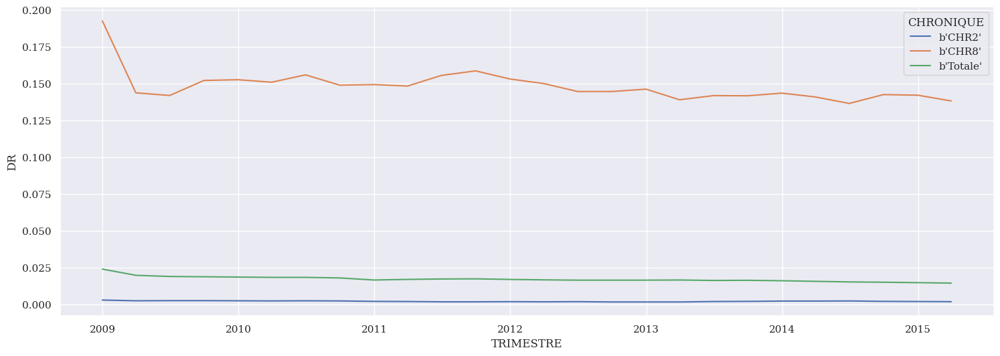

In [13]:
sns.lineplot(data=data,x='TRIMESTRE',y='DR',hue='CHRONIQUE',color= 'r')

Nous observons que la probabilité de défaut est plus élevée pour CHR8 (mauvais client), suivi de CHR Totale et CHR2 (bon client).

<AxesSubplot: xlabel='DR', ylabel='Count'>

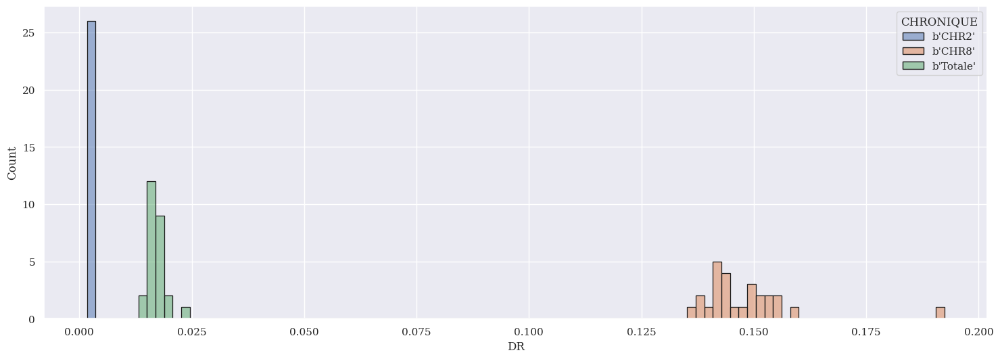

In [14]:
sns.histplot(data=data,x='DR',hue='CHRONIQUE',bins = 100, color='c', edgecolor='k')

Nous observons une plus grande dispersion des probabilités de défaut pour CHR8, puis CHR Totale 

## Type de client

<AxesSubplot: xlabel='CD_TY_CLI_RCI_1', ylabel='Count'>

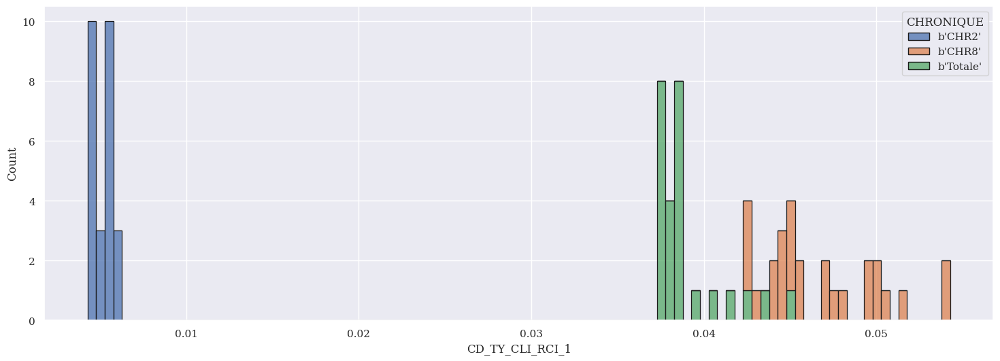

In [15]:
sns.histplot(data=data,x='CD_TY_CLI_RCI_1',hue='CHRONIQUE',bins = 100, color='c', edgecolor='k',multiple="stack")

Pour les particuliers, on observe une probabilité de défaut relativement similaire entre CHR8 et CHR Totale, même si CHR Totale reste plus faible. 

## Mode d'habitation

<AxesSubplot: xlabel='CD_MOD_HABI_1', ylabel='Count'>

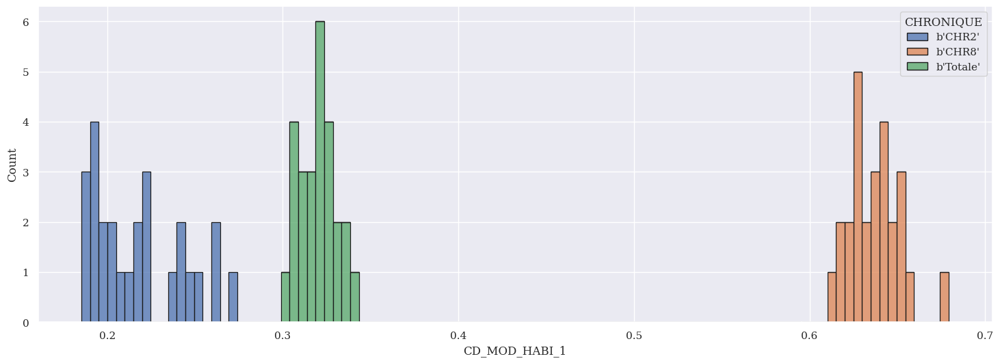

In [79]:
sns.histplot(data=data,x='CD_MOD_HABI_1',hue='CHRONIQUE',bins = 100, color='c', edgecolor='k',multiple="stack")

Pour les locataires, CHR Totale est plus proche de CHR2. Les mauvais clients ont un taux de défaut bien plus élevée 

## Etat civil

<AxesSubplot: xlabel='CD_ETA_CIV_1', ylabel='Count'>

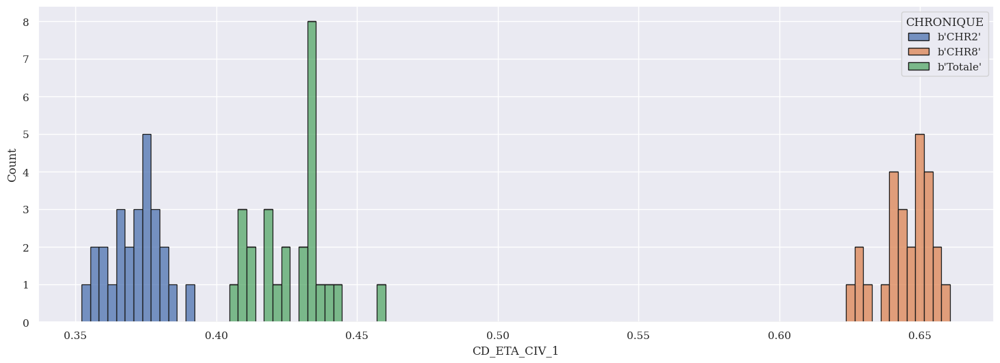

In [17]:
sns.histplot(data=data,x='CD_ETA_CIV_1',hue='CHRONIQUE',bins = 100, color='c', edgecolor='k',multiple="stack")

Pour les célibataires, CHR Totale est plus proche de CHR2. Les mauvais clients ont un taux de défaut bien plus élevée 

## Code qualité du véhicule

<AxesSubplot: xlabel='CD_QUAL_VEH_1', ylabel='Count'>

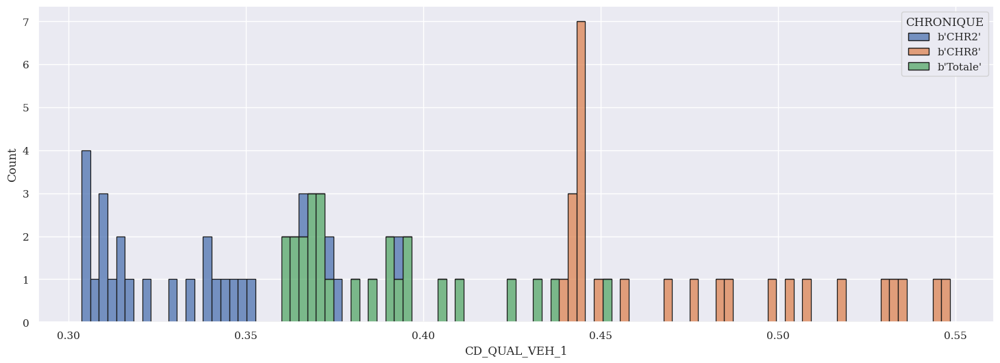

In [18]:
sns.histplot(data=data,x='CD_QUAL_VEH_1',hue='CHRONIQUE',bins = 100, color='c', edgecolor='k',multiple="stack")

Pour les véhicules d'occasion, on obeserve une grande disparité des taux de défaut. En particulier, les CHR2 et CHR Totale se superposent. Ceci indique que dans le cas des véhicules d'occasion, l'incertitude sur le taux de défaut est d'autant plus grand 

## Profession

<AxesSubplot: xlabel='CD_PROF_1', ylabel='Count'>

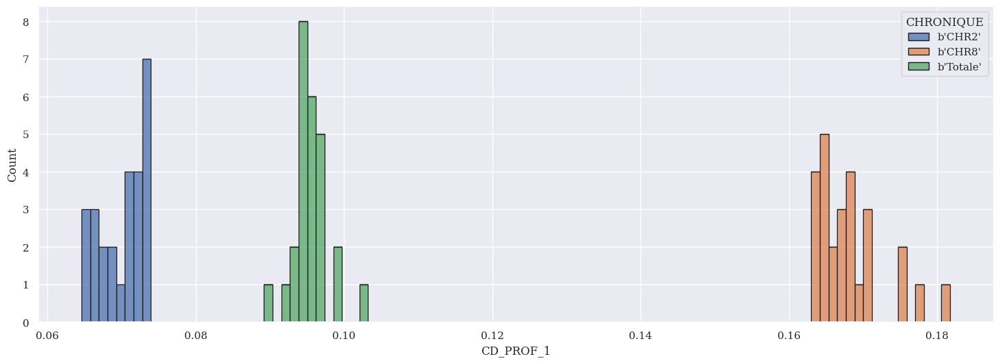

In [19]:
sns.histplot(data=data,x='CD_PROF_1',hue='CHRONIQUE',bins = 100, color='c', edgecolor='k',multiple="stack")

Pour les ouvriers, les taux de défauts sont beaucoup plus faibles. L'ordre CHR2, CHR Totale, CHR8 est respecté

<AxesSubplot: xlabel='CD_PROF_2', ylabel='Count'>

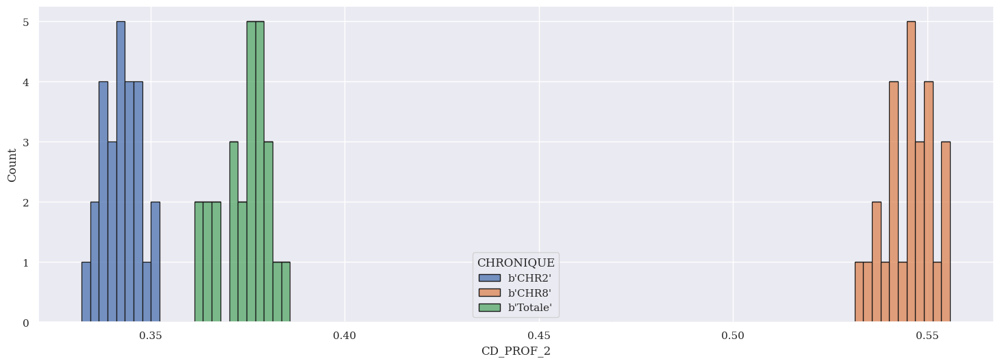

In [20]:
sns.histplot(data=data,x='CD_PROF_2',hue='CHRONIQUE',bins = 100, color='c', edgecolor='k',multiple="stack")

Pour les employés, les taux de défauts sont relativement élevés. L'ordre CHR2, CHR Totale, CHR8 est respecté

<AxesSubplot: xlabel='CD_PROF_3', ylabel='Count'>

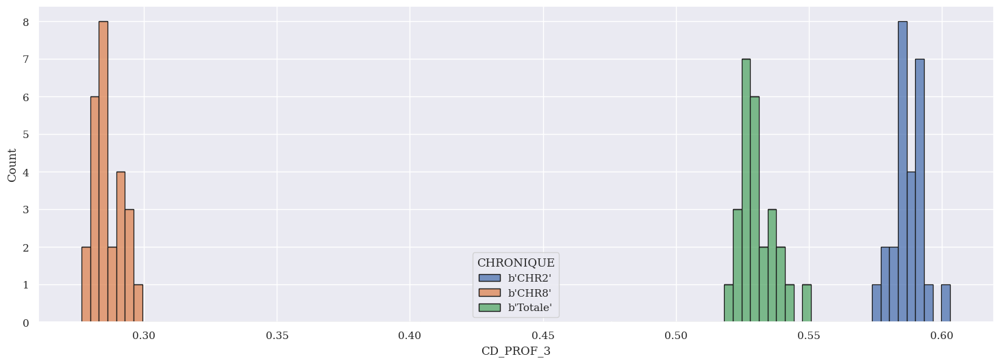

In [21]:
sns.histplot(data=data,x='CD_PROF_3',hue='CHRONIQUE',bins = 100, color='c', edgecolor='k',multiple="stack")

Pour les retraités, cadres, les taux de défauts sont relativement élevés. L'ordre CHR2, CHR Totale, CHR8 est inversé

## Macro

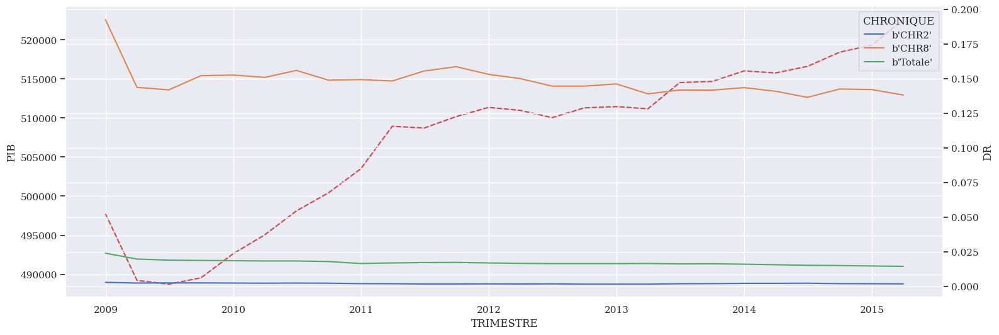

In [80]:
fig, ax1 = plt.subplots()
sns.lineplot(data=data,x='TRIMESTRE',y='PIB',color='r',linestyle="dashed",ax=ax1)

ax2 = ax1.twinx()
sns.lineplot(data=data,x='TRIMESTRE',y='DR',hue='CHRONIQUE',ax=ax2)

plt.show()

Le PIB semble influant seulement pour CHR8 (mauvais client), notamment en 2009. Cependant cette influence reste relativement faible pour les années qui suivent

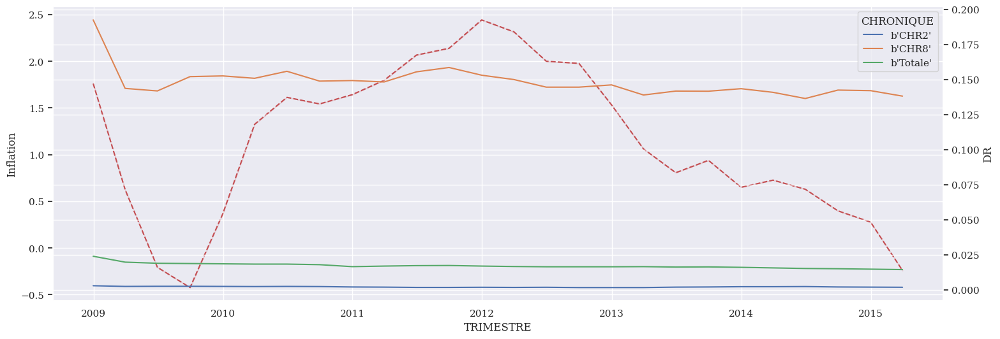

In [81]:
fig, ax1 = plt.subplots()
sns.lineplot(data=data,x='TRIMESTRE',y='Inflation',color='r',linestyle="dashed",ax=ax1)

ax2 = ax1.twinx()
sns.lineplot(data=data,x='TRIMESTRE',y='DR',hue='CHRONIQUE',ax=ax2)

plt.show()

L'inflation semble influante seulement pour CHR8 (mauvais client), notamment en 2009. Cependant cette influence reste relativement faible pour les années qui suivent

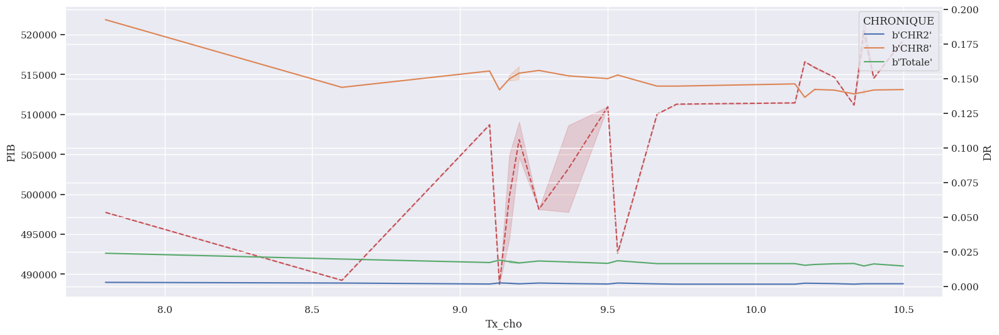

In [82]:
fig, ax1 = plt.subplots()
sns.lineplot(data=data,x='Tx_cho',y='PIB',color='r',linestyle="dashed",ax=ax1)

ax2 = ax1.twinx()
sns.lineplot(data=data,x='Tx_cho',y='DR',hue='CHRONIQUE',ax=ax2)

plt.show()

Le taux de chomage semble assez influant sur CHR8 avec des variations similaires pour un taux entre 8 et 8.5

# Split Data set

On sépare les catégories de données

In [83]:
col_portefeuille = ['mean_1', 'median_1', 'p5_1', 'p10_1', 'p25_1', 'p75_1', 'p90_1',
       'p95_1', 'mean_2', 'median_2', 'p5_2', 'p10_2', 'p25_2', 'p75_2',
       'p90_2', 'p95_2', 'mean_3', 'median_3', 'p5_3', 'p10_3', 'p25_3',
       'p75_3', 'p90_3', 'p95_3', 'mean_4', 'median_4', 'p5_4', 'p10_4',
       'p25_4', 'p75_4', 'p90_4', 'p95_4', 'mean_5', 'median_5', 'p5_5',
       'p10_5', 'p25_5', 'p75_5', 'p90_5', 'p95_5', 'mean_6', 'median_6',
       'p5_6', 'p10_6', 'p25_6', 'p75_6', 'p90_6', 'p95_6', 'mean_7',
       'median_7', 'p5_7', 'p10_7', 'p25_7', 'p75_7', 'p90_7', 'p95_7',
       'mean_8', 'median_8', 'p5_8', 'p10_8', 'p25_8', 'p75_8', 'p90_8',
       'p95_8']
       
col_clients = ['CD_TY_CLI_RCI_1', 'CD_TY_CLI_RCI_2', 'CD_ETA_CIV_1',
       'CD_ETA_CIV_2', 'CD_MOD_HABI_1', 'CD_MOD_HABI_2', 'CD_PROF_1',
       'CD_PROF_2', 'CD_PROF_3', 'CD_QUAL_VEH_1', 'CD_QUAL_VEH_2']

col_macro = ['PIB',
       'Inflation', 'Tx_cho']

Nettoyage données clients doublé et triplé

In [84]:
col_clients.remove('CD_TY_CLI_RCI_2')
col_clients.remove('CD_ETA_CIV_2')
col_clients.remove('CD_MOD_HABI_2')
col_clients.remove('CD_PROF_3')
col_clients.remove('CD_QUAL_VEH_2')

Definition des 3 datasets des 3 chroniques

In [85]:
Xt = dft[[*col_portefeuille,*col_clients,*col_macro]]
X2 = df2[[*col_portefeuille,*col_clients,*col_macro]]
X8 = df8[[*col_portefeuille,*col_clients,*col_macro]]

# Exploration chronique 2

## Exploration DR

count    26.000000
mean      0.002154
std       0.000344
min       0.001700
25%       0.001900
50%       0.002100
75%       0.002400
max       0.003000
Name: DR, dtype: float64


c:\Users\arthu\OneDrive\Documents\DRiM\DrimGame2022\DreamLib\visualization.py:16: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(Y, fit=stats.norm, ax=axes[2])


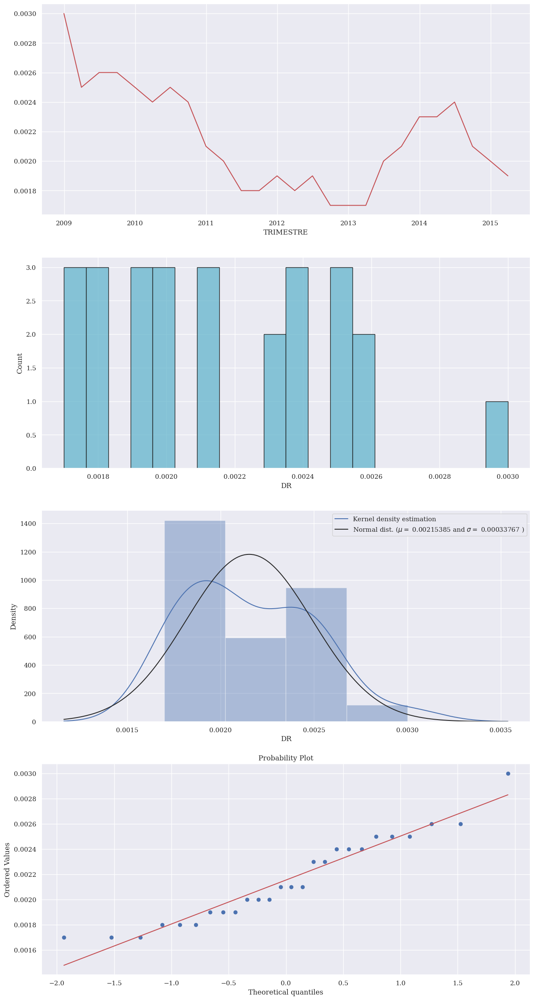

In [86]:
explo_DR(df2,Y2)

Pour CHR2, on observe que le taux de défaut diminue jusqu'en 2011 pour augmenter en 2013. On remarque que la distribution des taux de défauts et la loi normale approximées sont relativement similaires. Ceci semble assez encourageant pour la suite. Cependant, nous ne pouvons pas appliquer des tests de stationnarité comme celui de Jarque-Bera car nous n'avons pas assez de données (moins de 2000)

## Exploration portefeuille

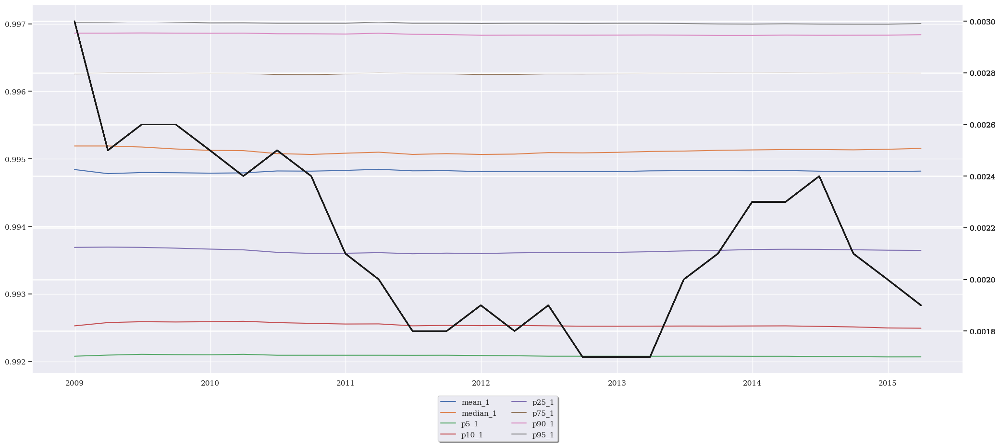

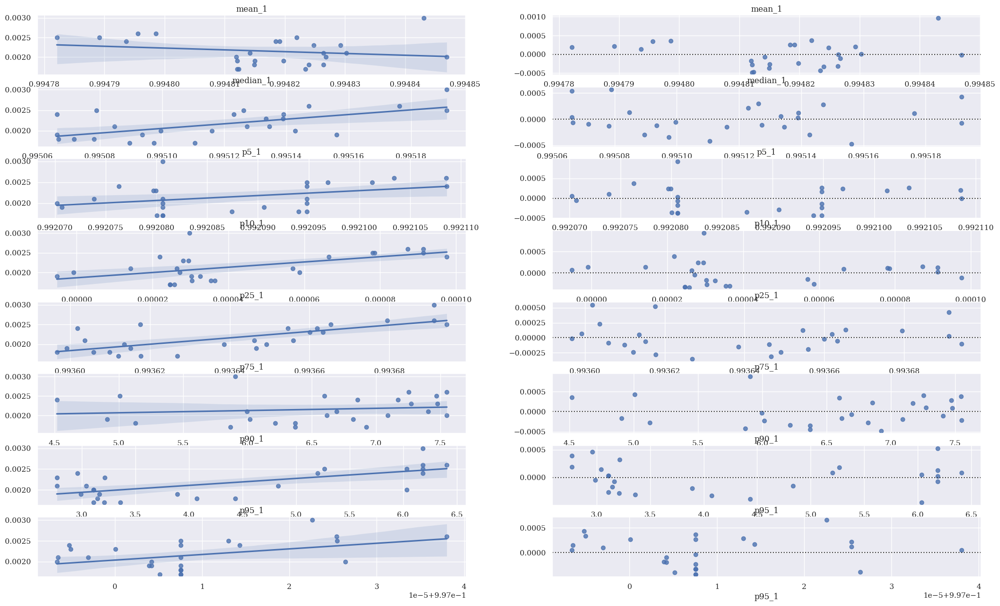

In [87]:
explo_portefeuille(df2,Y2,1)

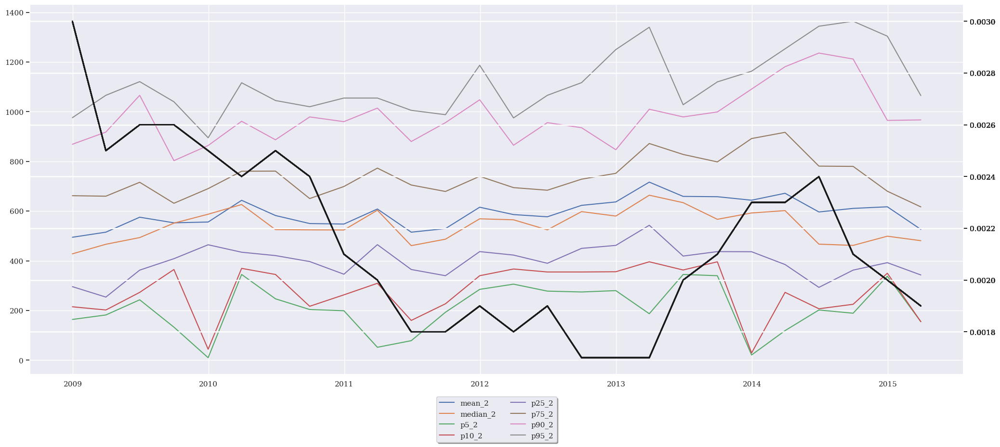

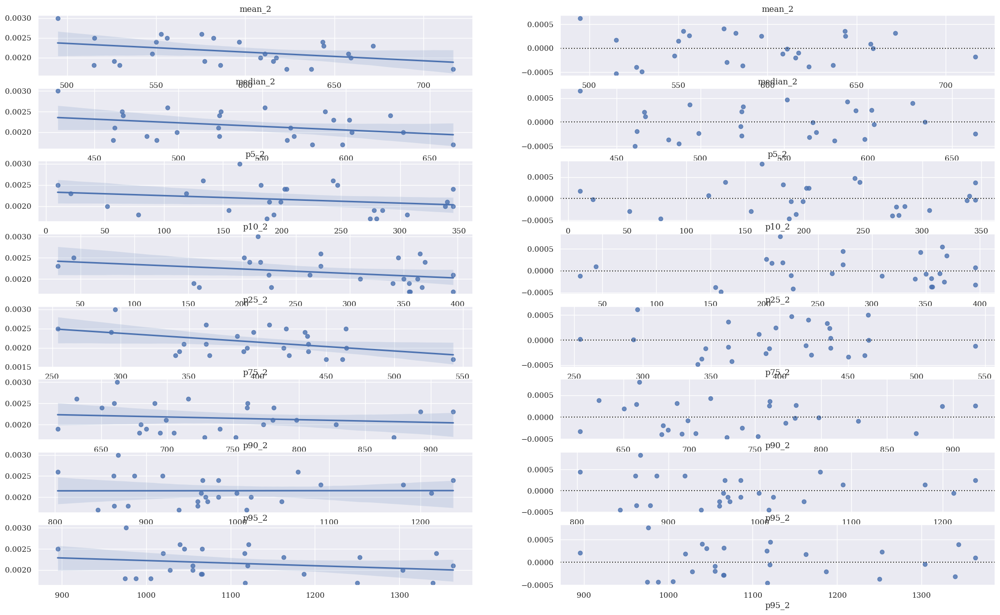

In [88]:
explo_portefeuille(df2,Y2,2)

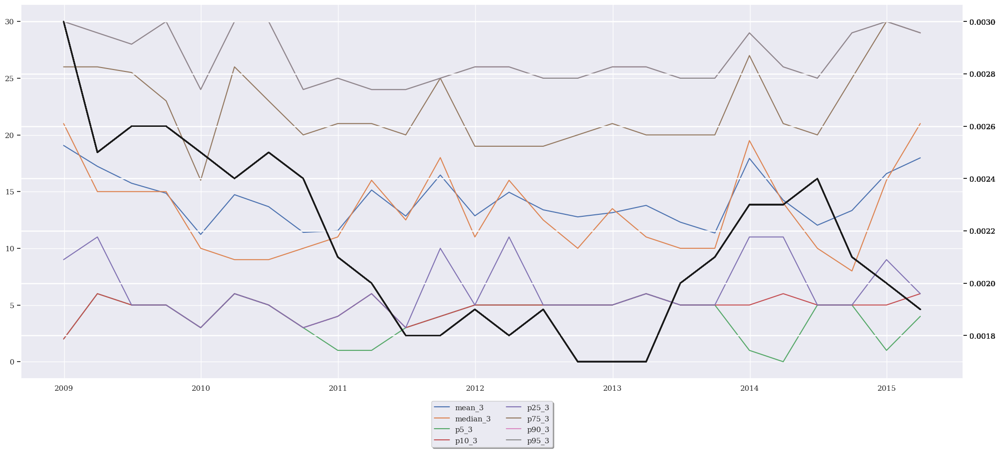

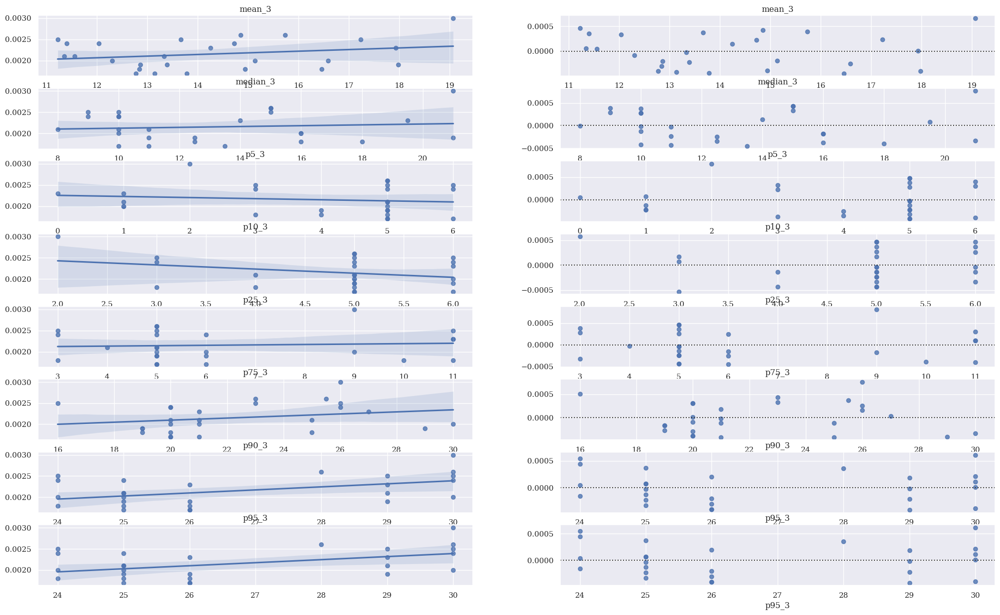

In [89]:
explo_portefeuille(df2,Y2,3)

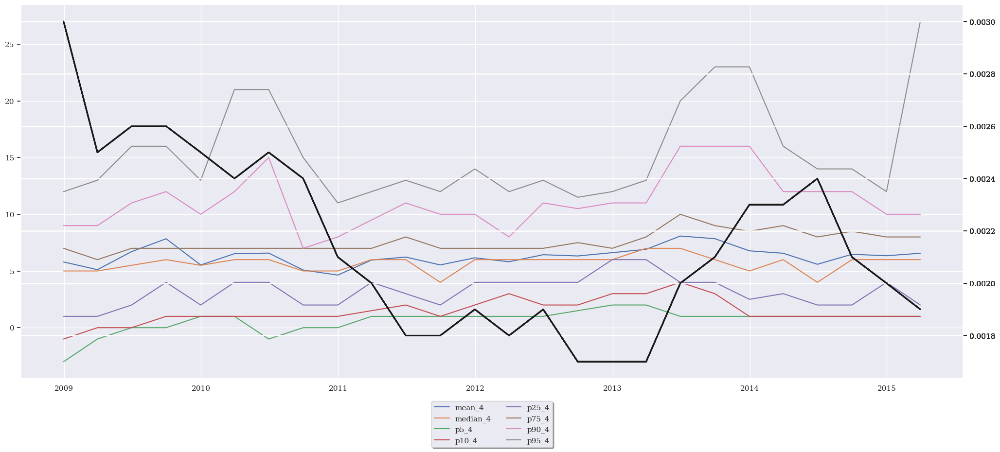

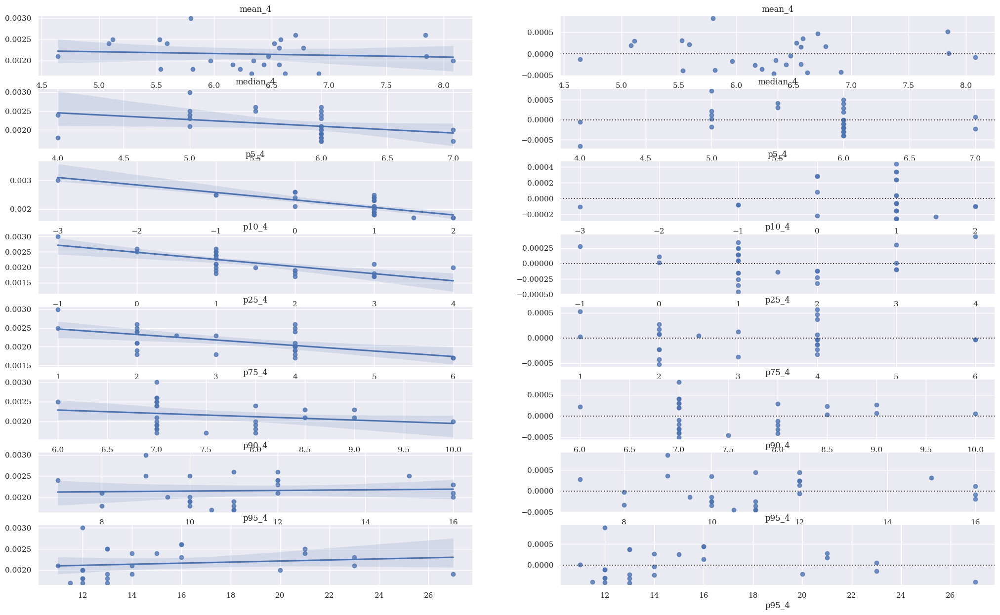

In [90]:
explo_portefeuille(df2,Y2,4)

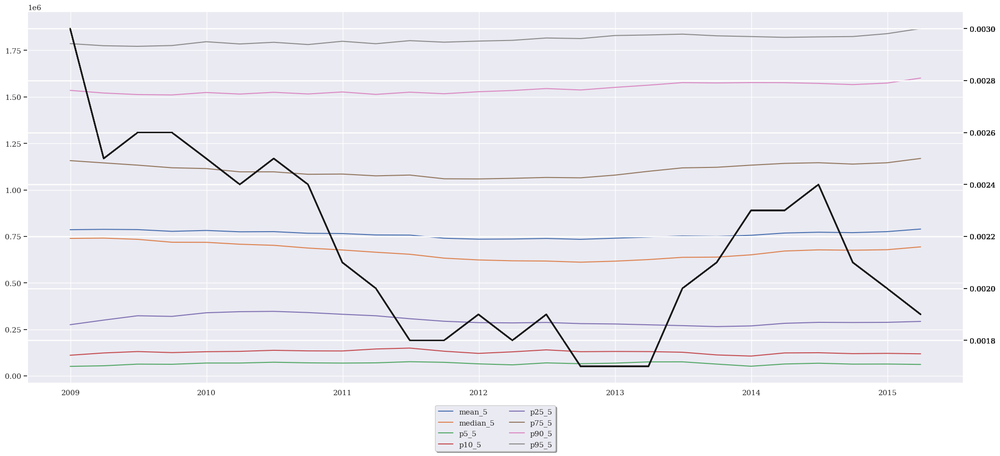

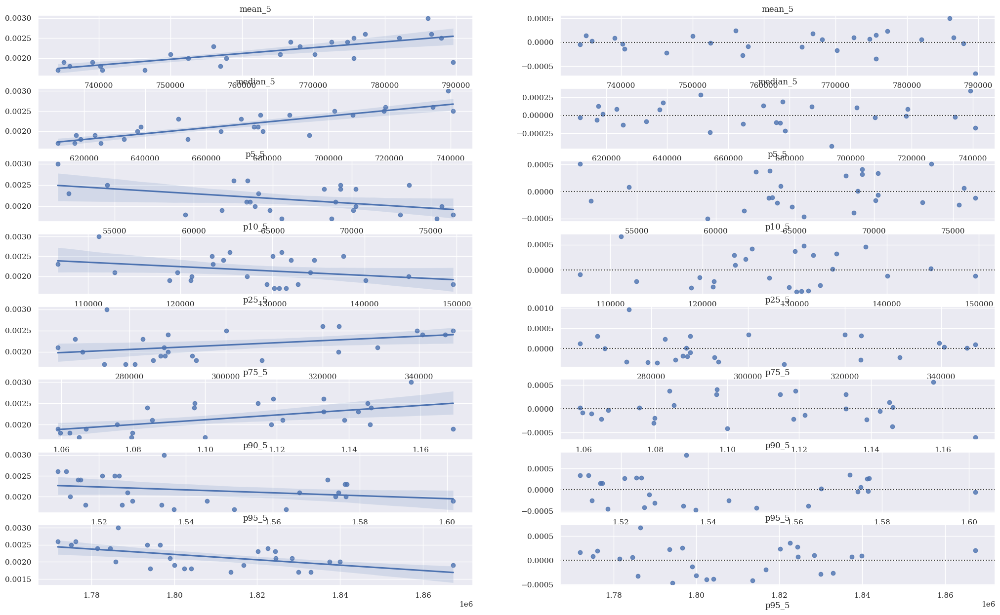

In [91]:
explo_portefeuille(df2,Y2,5)

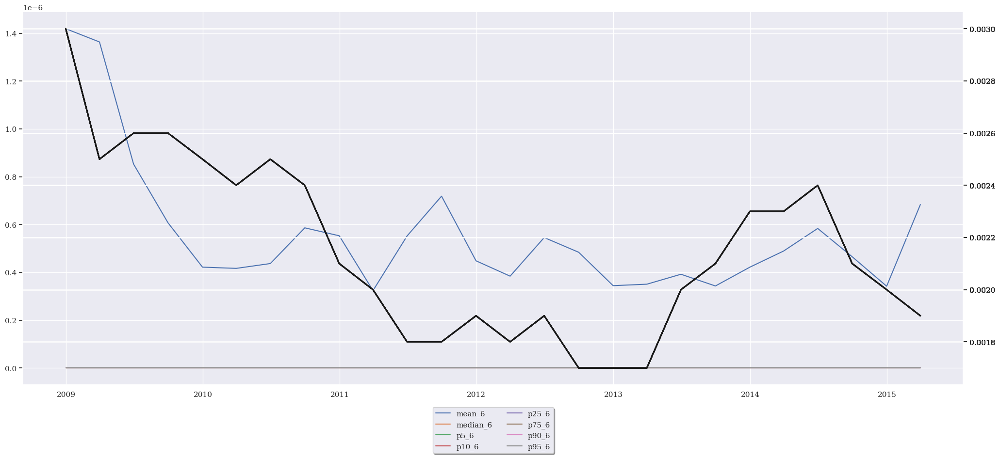

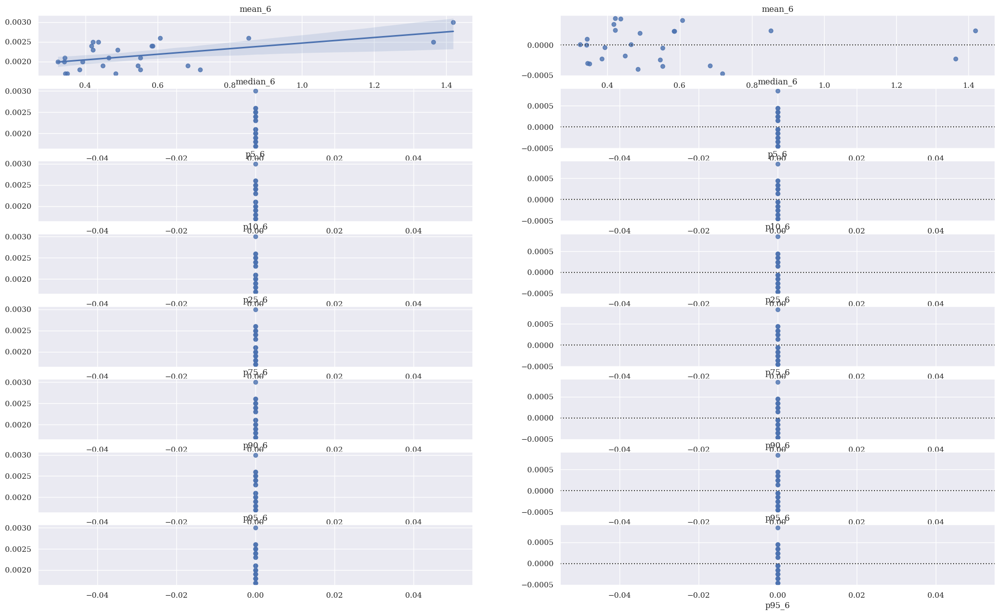

In [92]:
explo_portefeuille(df2,Y2,6)

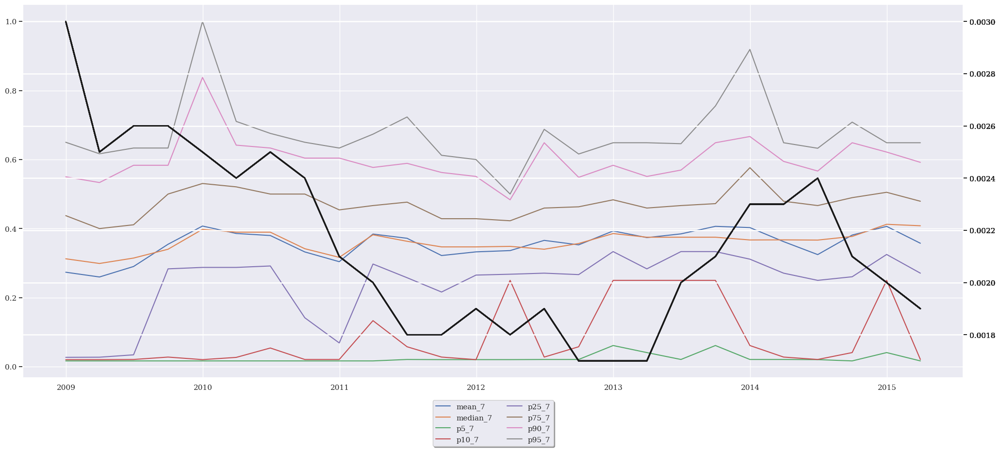

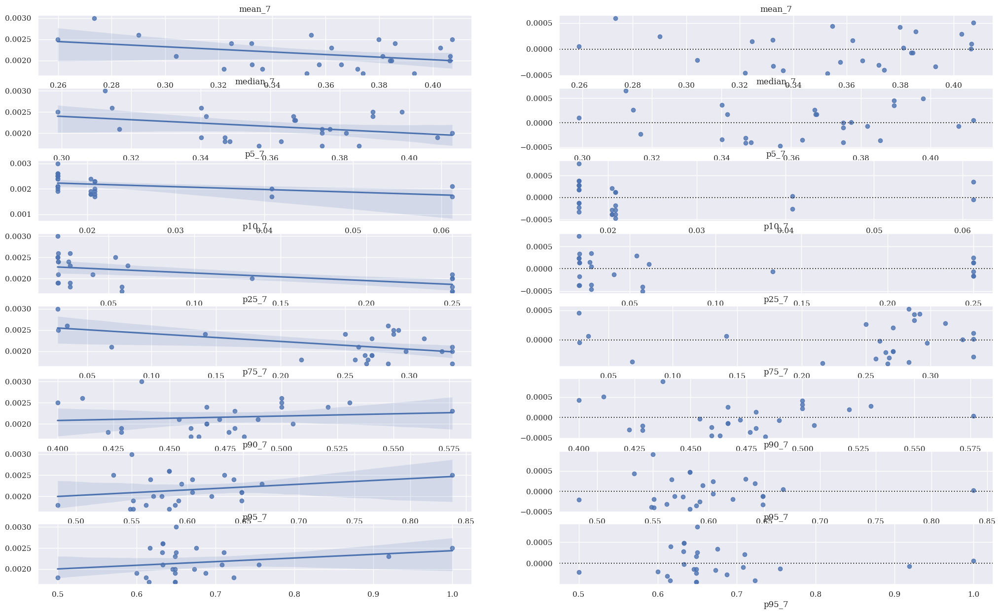

In [93]:
explo_portefeuille(df2,Y2,7)

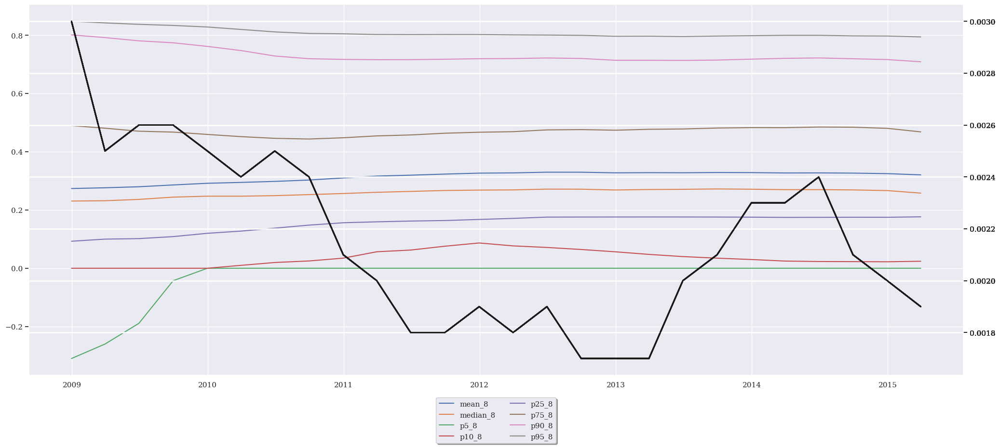

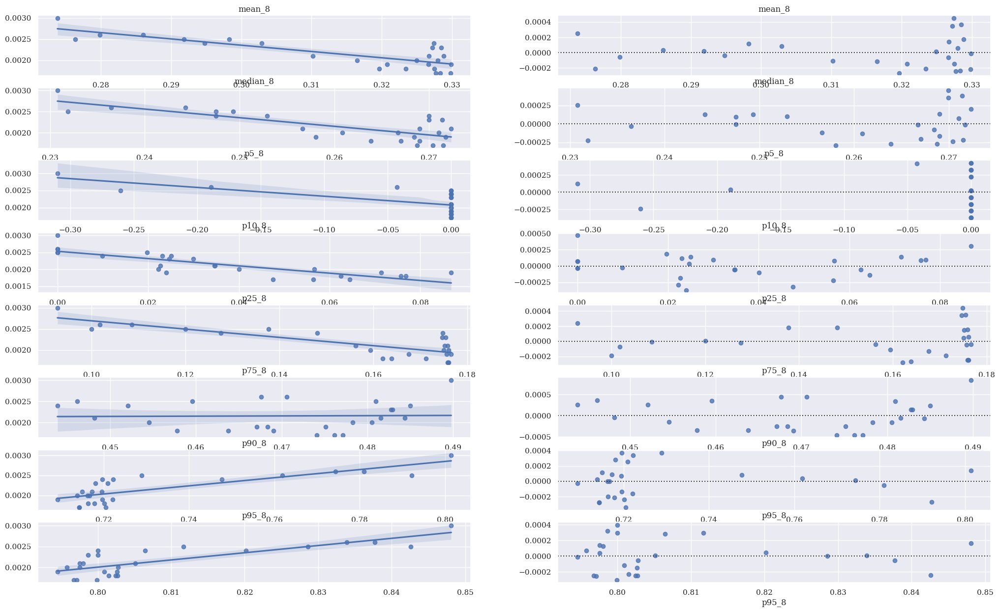

In [94]:
explo_portefeuille(df2,Y2,8)

## Type de client

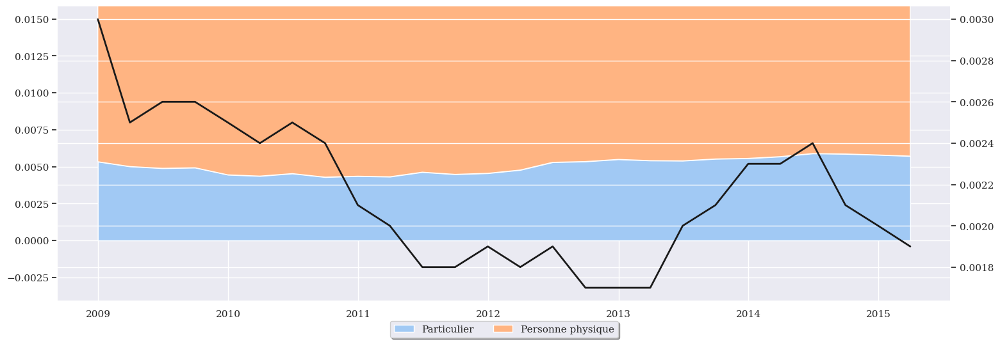

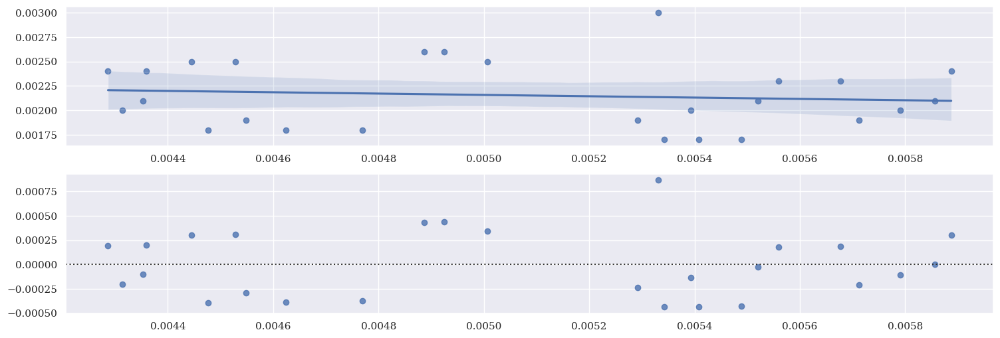

In [95]:
explo_client(df2,Y2)

Le taux de défaut n'est pas vraiment dépendant du type de client ces dernières années, d'après les variations du graphique ci-dessus

## Mode d'habitation

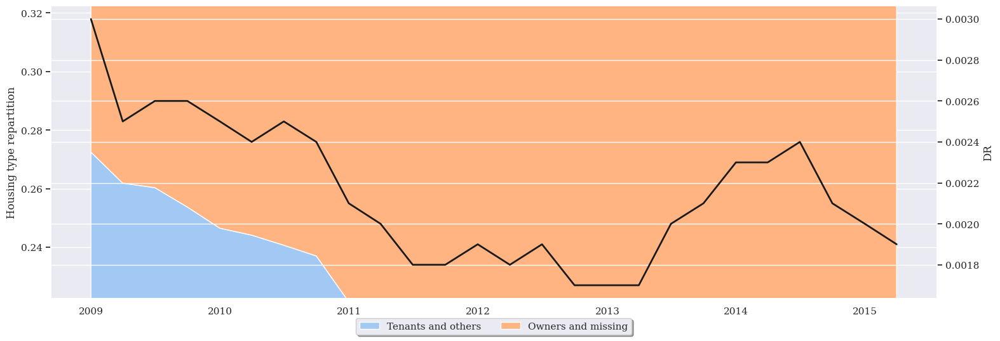

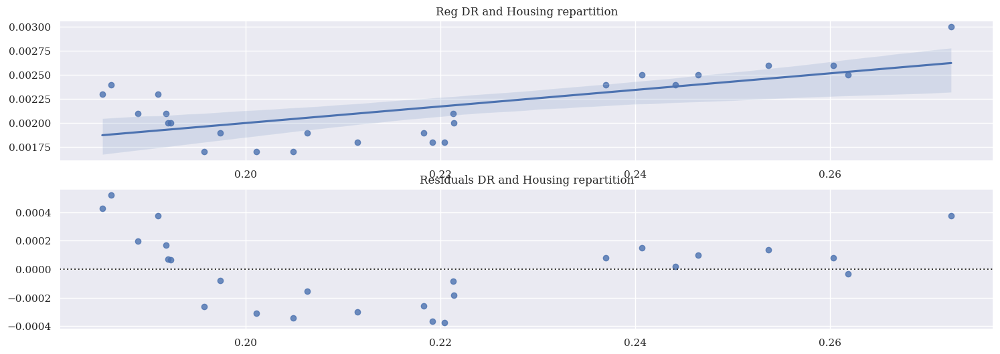

In [96]:
explo_habitation(df2,Y2)

On remarque que plus il y a de propriétaires, plus le taux de défauts est faible. Ce qui semble cohérent. En effet, si un individu a déjà effectué un emprunt, il sera plus difficile de contracter un second emprunt 

## Etat civil

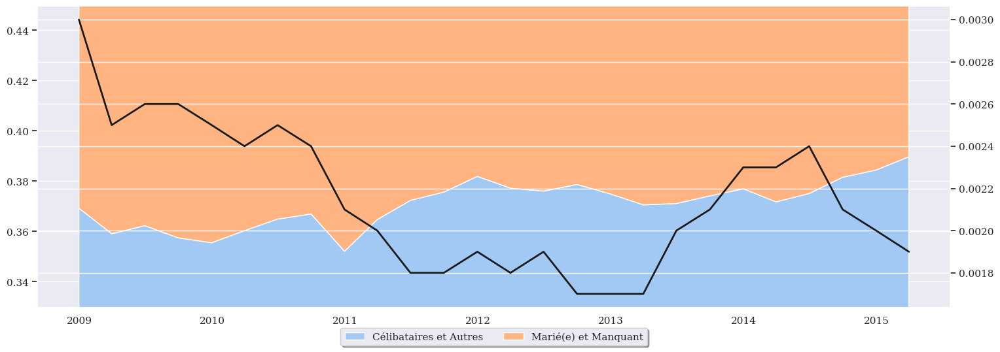

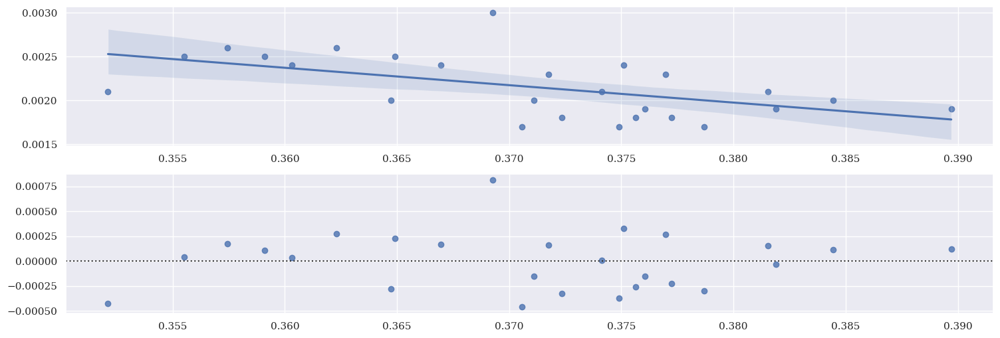

In [97]:
explo_civil(df2,Y2)

## Code qualité du véhicule

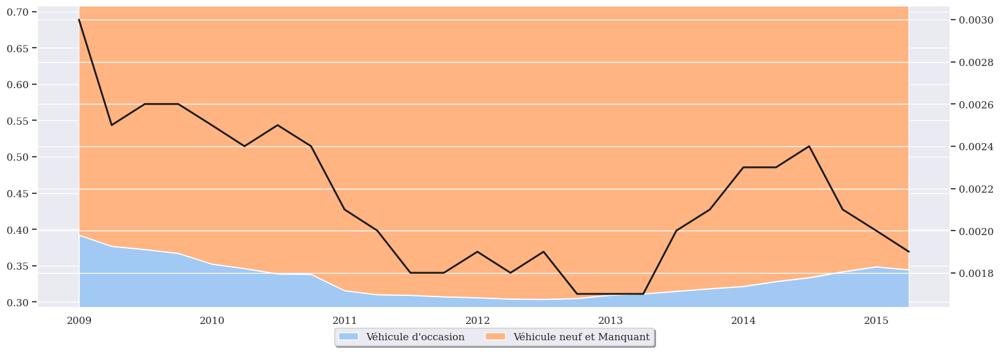

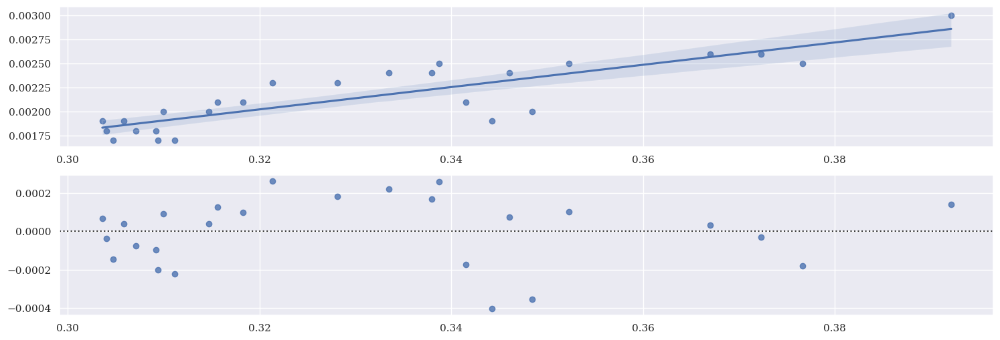

In [98]:
explo_code_qualite(df2,Y2)

On remarque que plus il y a de véhicules d'occasion, plus la probabilité de défaut est grande, ce qui semble cohérent. En effet, si les consommateurs s'orientent vers un véhicule d'occasion, c'est qu'ils n'ont pas forcément les moyens d'acquerir un neuf

## Profession

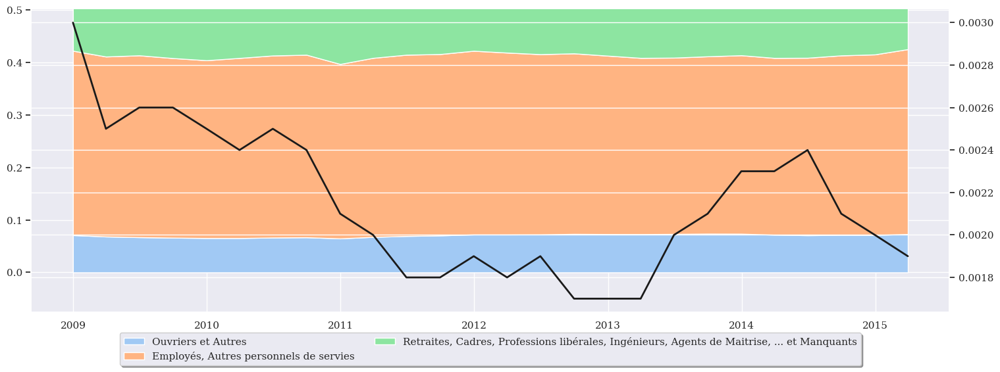

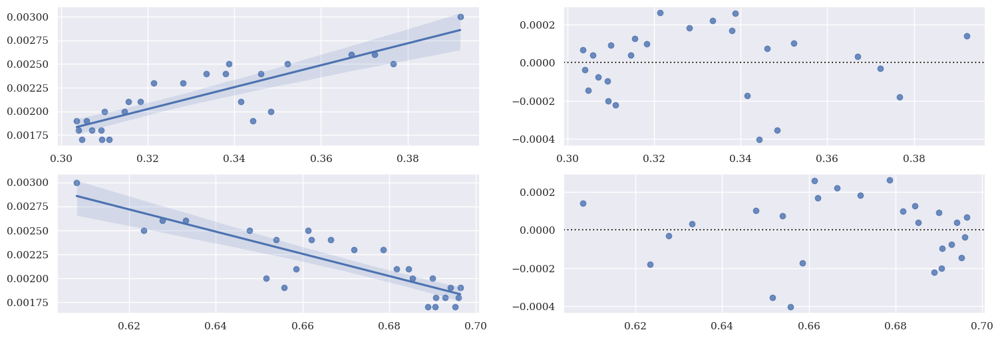

In [99]:
explo_profession(df2,Y2)

Les variations du taux de défaut ne sont pas vraiment dépendantes de la profession de l'individu

## Macro

**About PIB**

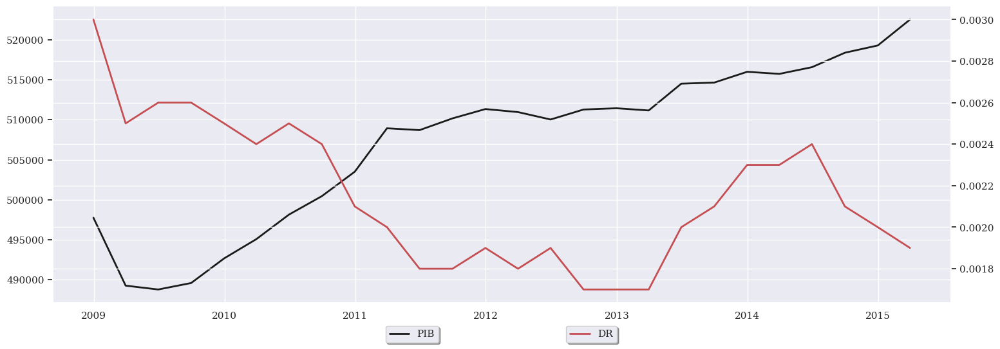

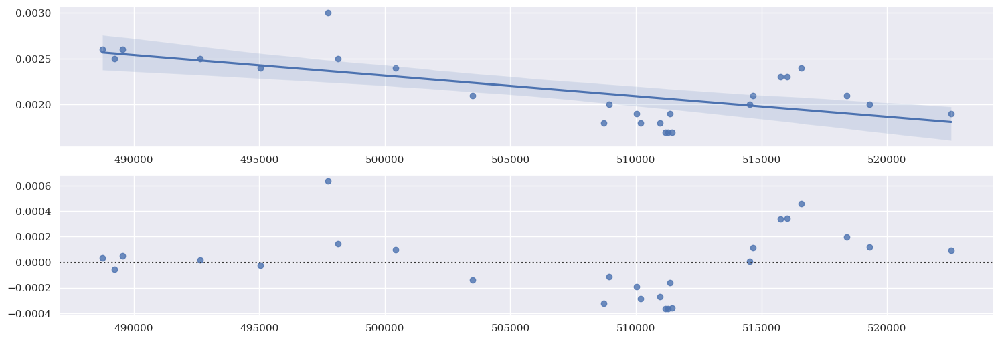

In [100]:
explo_pib(df2,Y2)

Les variations du PIB et du taux de défaut sont similaires seulement en 2009. (cf. relance post subprime)

**About Inflation**

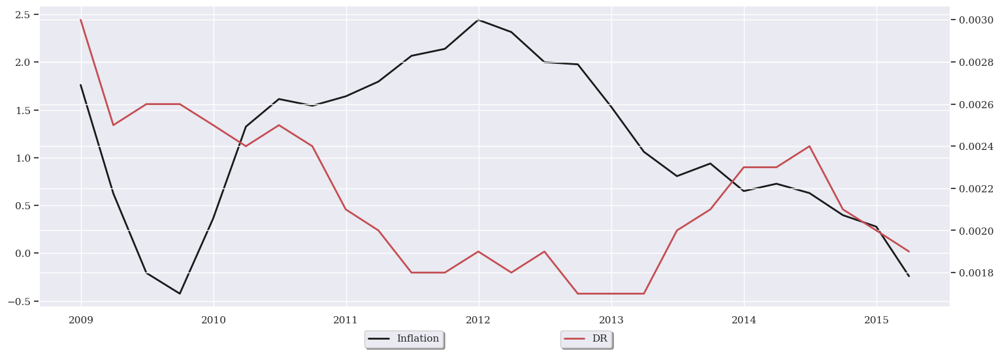

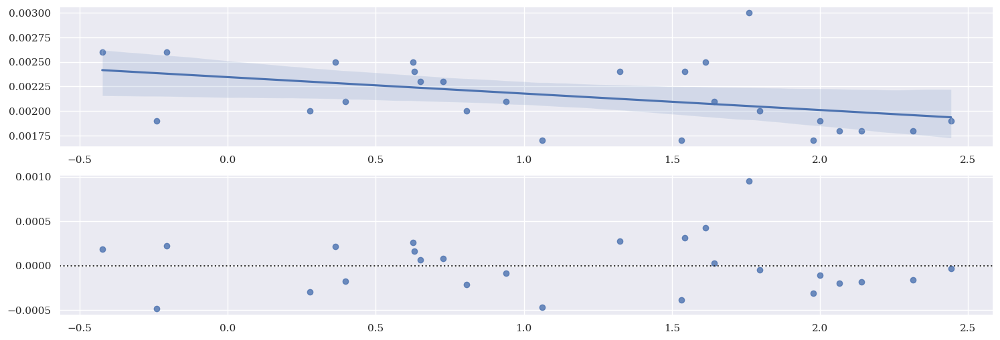

In [101]:
explo_inflation(df2,Y2)

Les variations du PIB et du taux de défaut sont similaires seulement en 2009 et 2014. (cf. relance post subprime)

**Taux chomage**

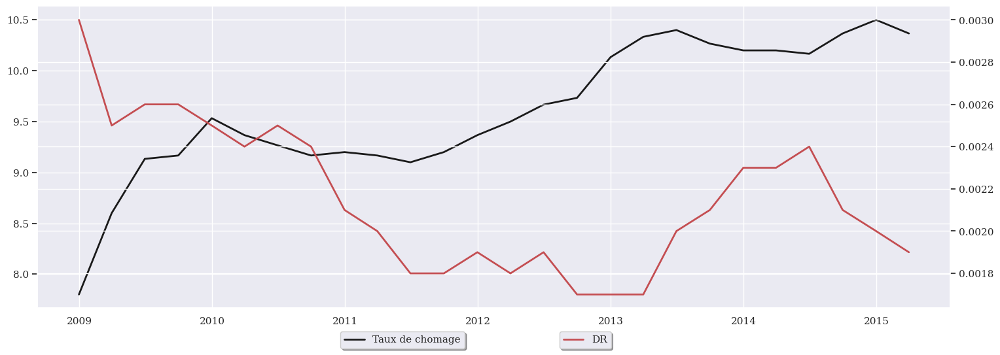

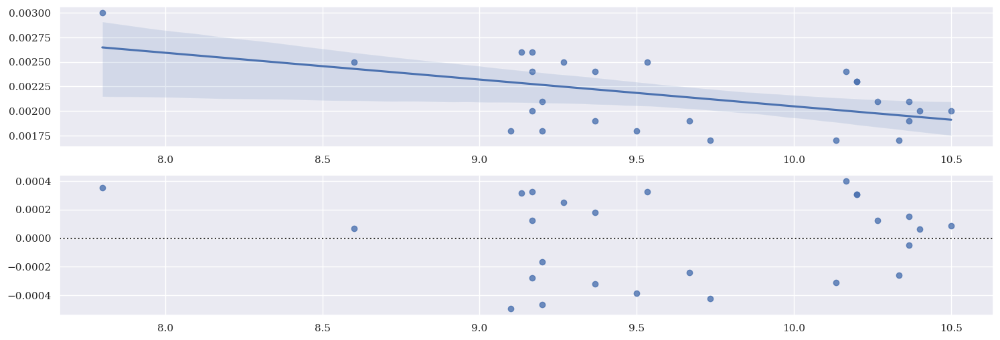

In [102]:
explo_txcho(df2,Y2)

Le taux de chomage est la variable macroéconomique qui a le plus d'influence sur le taux de défaut d'après le graphique ci-dessus

# Exploration chronique 8

## Exploration DR

count    26.000000
mean      0.148165
std       0.010758
min       0.136400
25%       0.141850
50%       0.145300
75%       0.151700
max       0.192400
Name: DR, dtype: float64


c:\Users\arthu\OneDrive\Documents\DRiM\DrimGame2022\DreamLib\visualization.py:16: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(Y, fit=stats.norm, ax=axes[2])


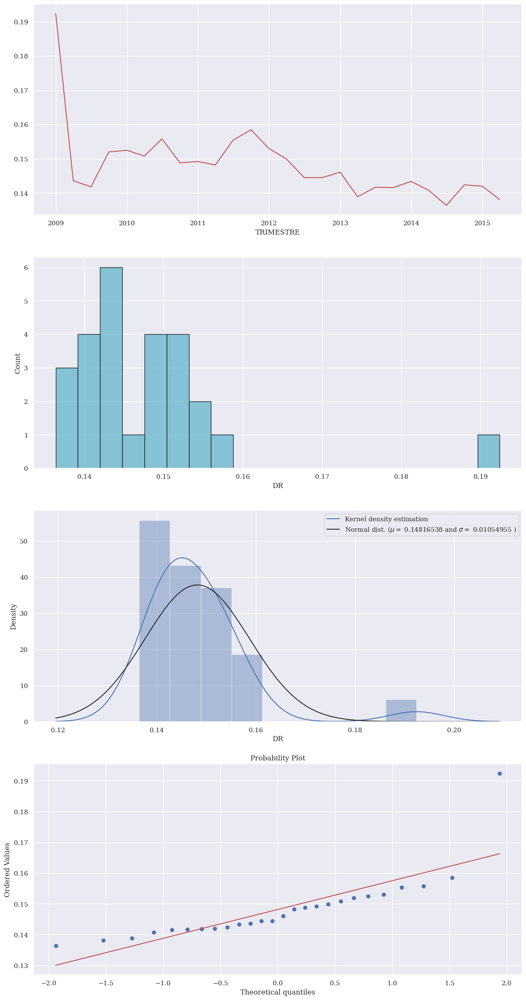

In [103]:
explo_DR(df8,Y8)

Pour CHR8, on observe que le taux de défaut est relativement stable à partir 2010. On remarque que la distribution des taux de défauts et la loi normale approximées sont relativement similaires. Ceci semble assez encourageant pour la suite. Cependant, nous ne pouvons pas appliquer des tests de stationnarité comme celui de Jarque-Bera car nous n'avons pas assez de données (moins de 2000). De plus, nous pouvons observer un outlier. Ce sera un enjeux important pour la suite de les supprimer. 

## Exploration portefeuille

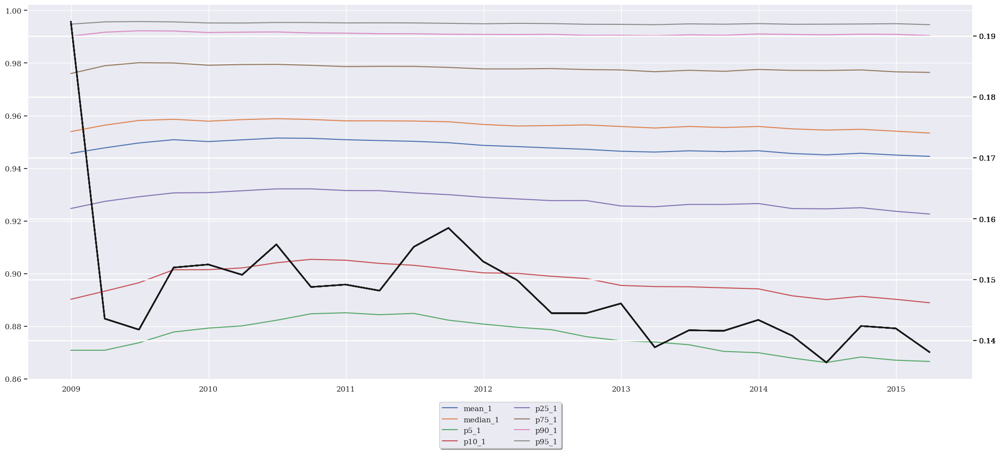

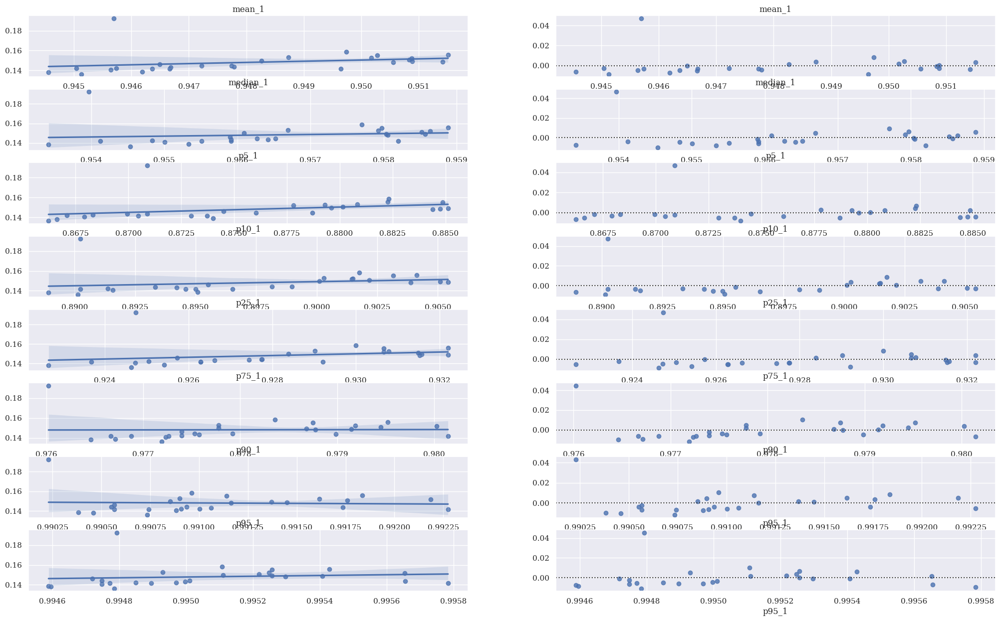

In [104]:
explo_portefeuille(df8,Y8,1)

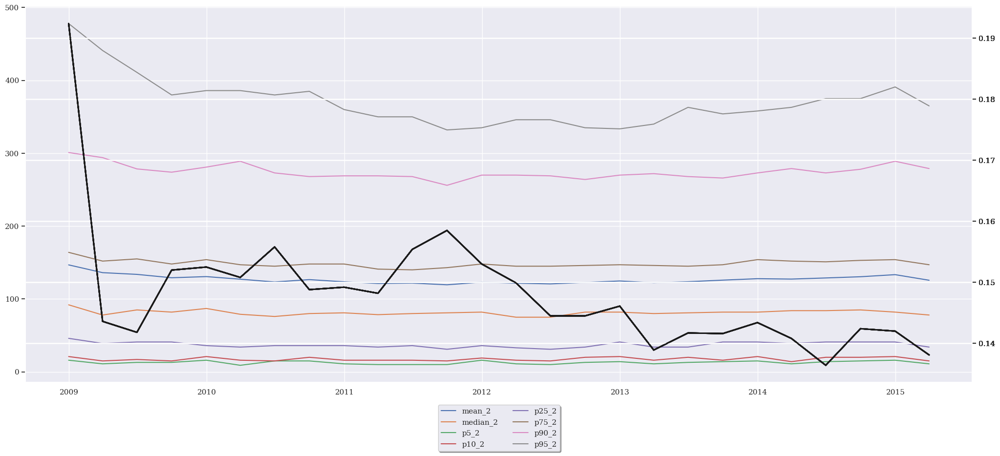

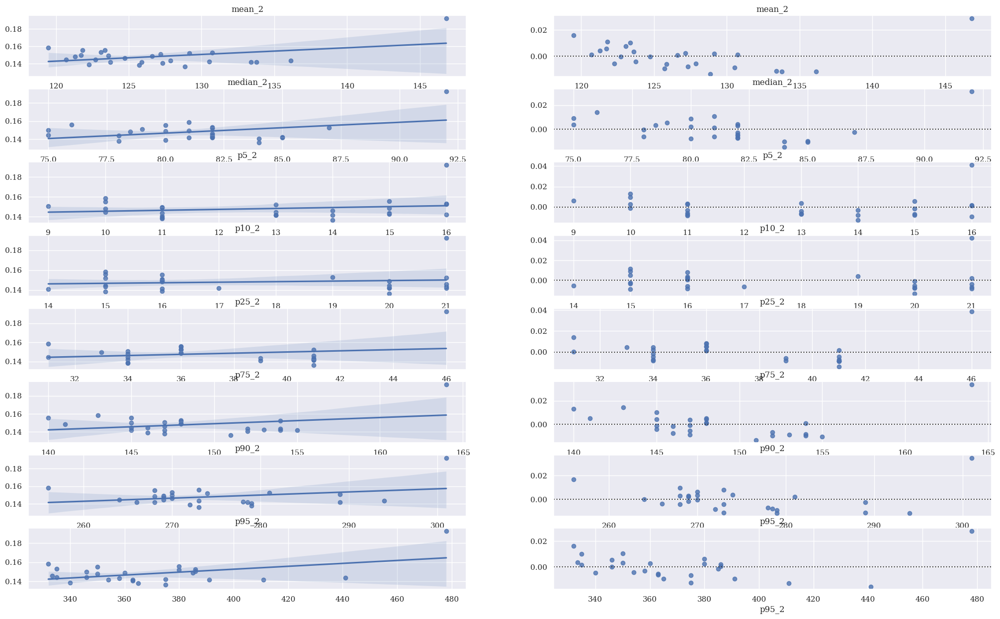

In [105]:
explo_portefeuille(df8,Y8,2)

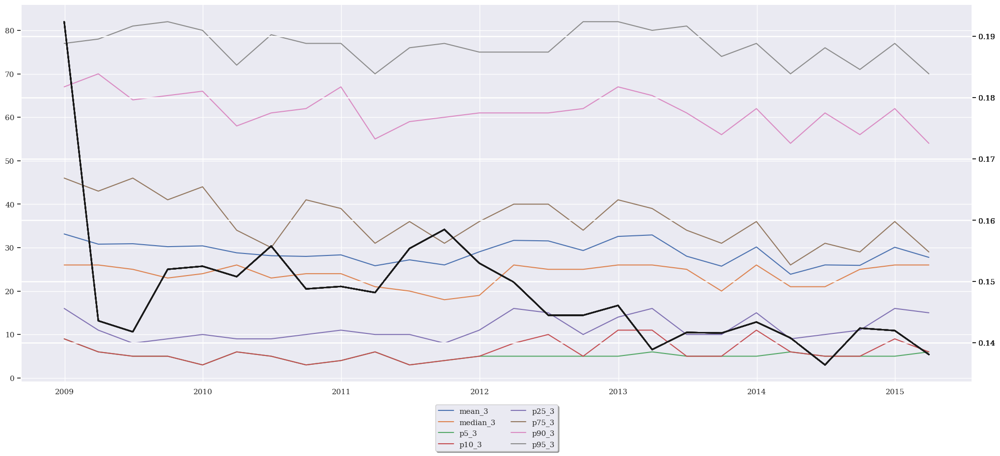

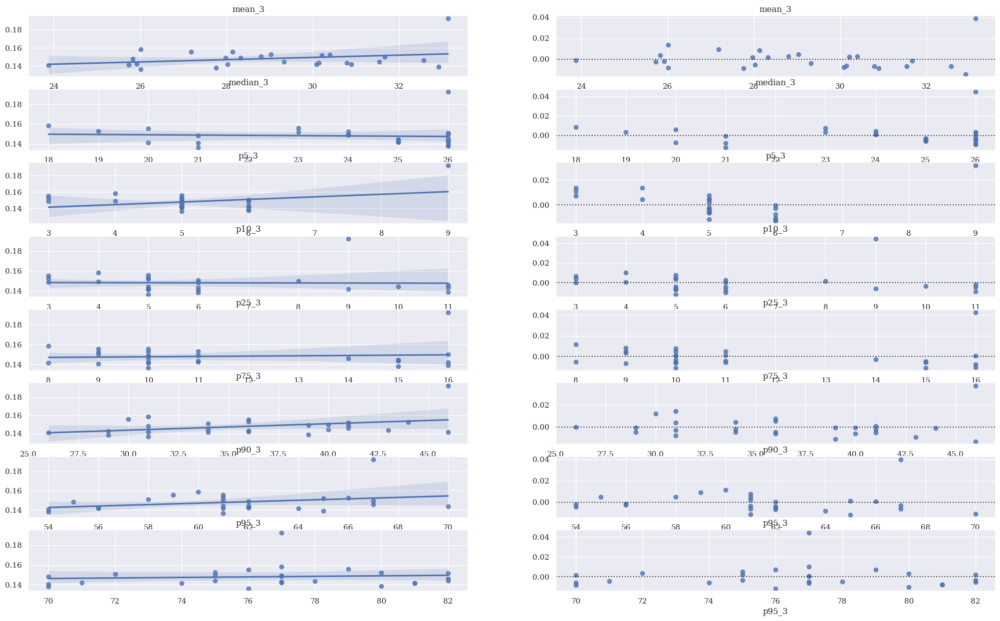

In [106]:
explo_portefeuille(df8,Y8,3)

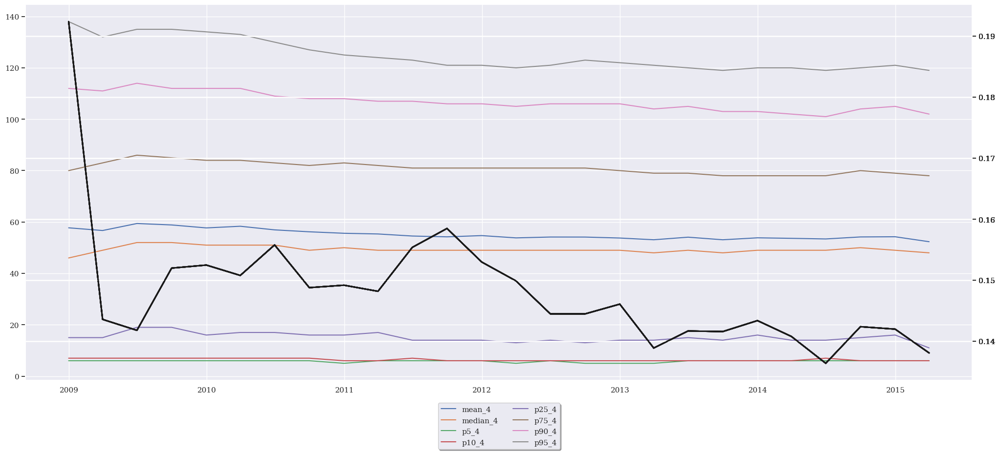

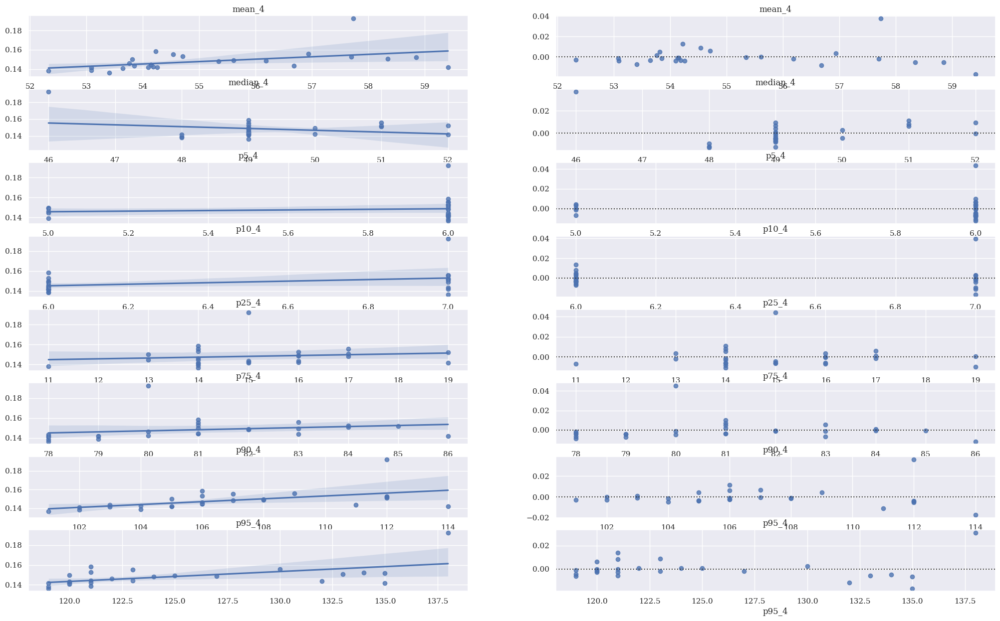

In [107]:
explo_portefeuille(df8,Y8,4)

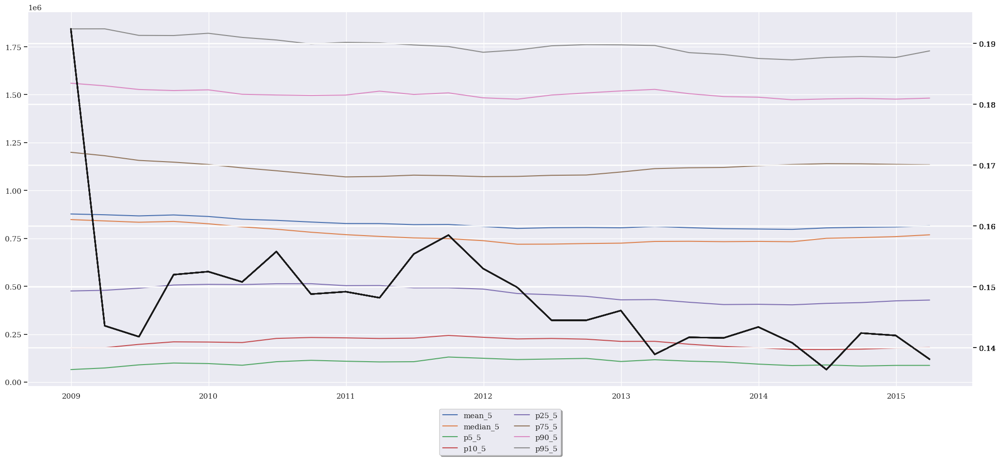

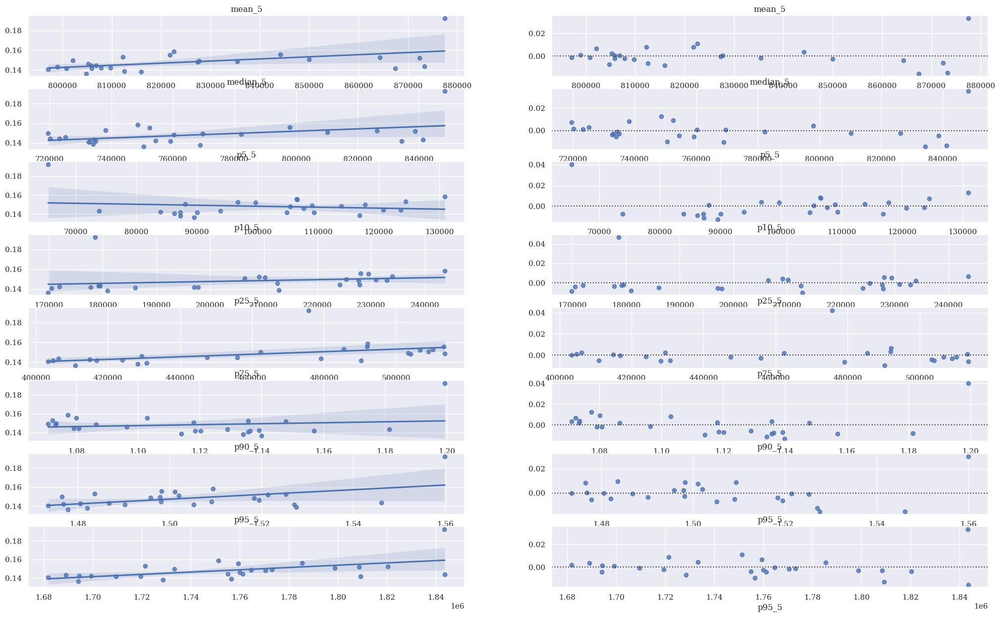

In [108]:
explo_portefeuille(df8,Y8,5)

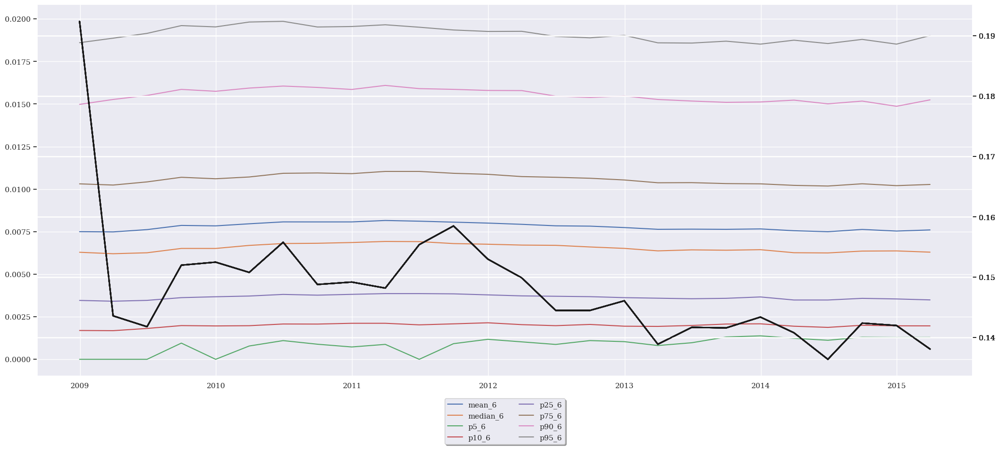

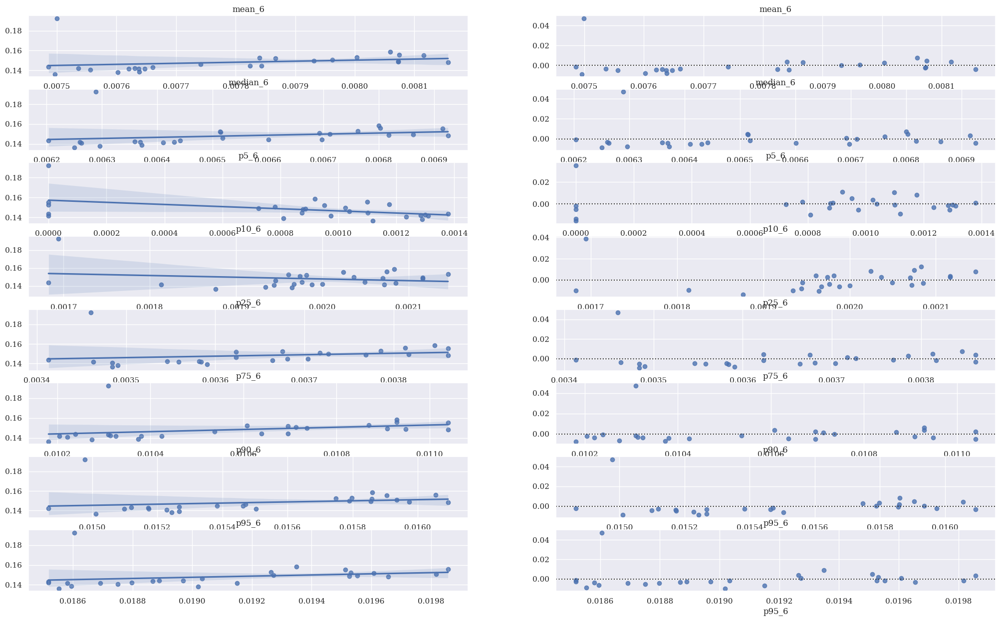

In [109]:
explo_portefeuille(df8,Y8,6)

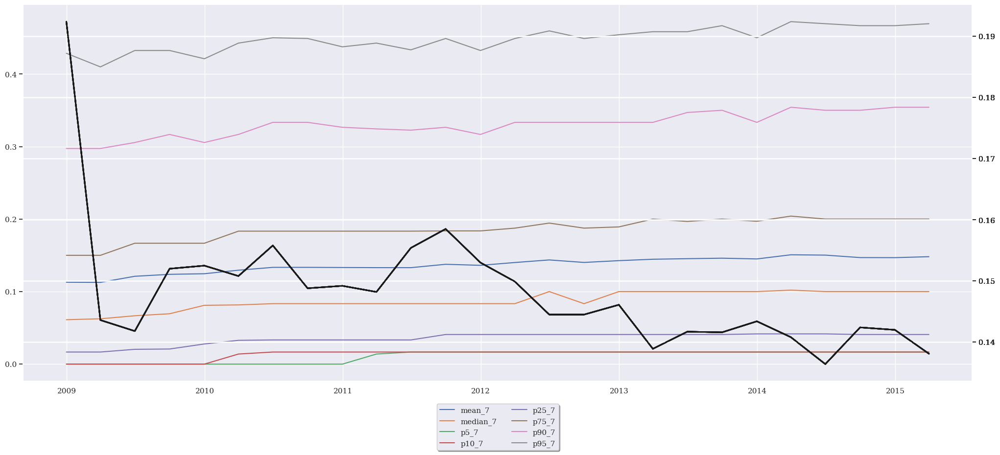

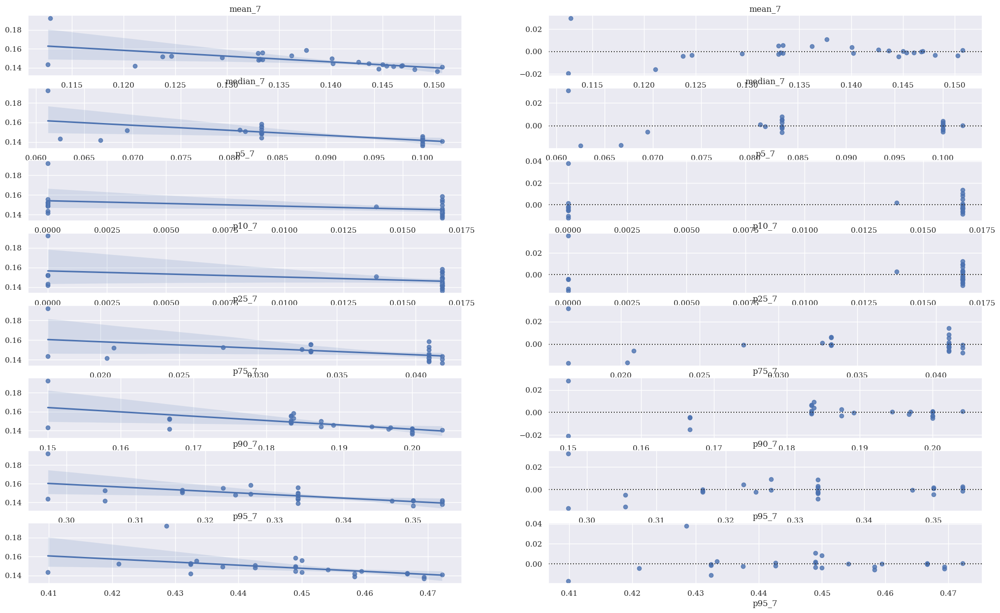

In [110]:
explo_portefeuille(df8,Y8,7)

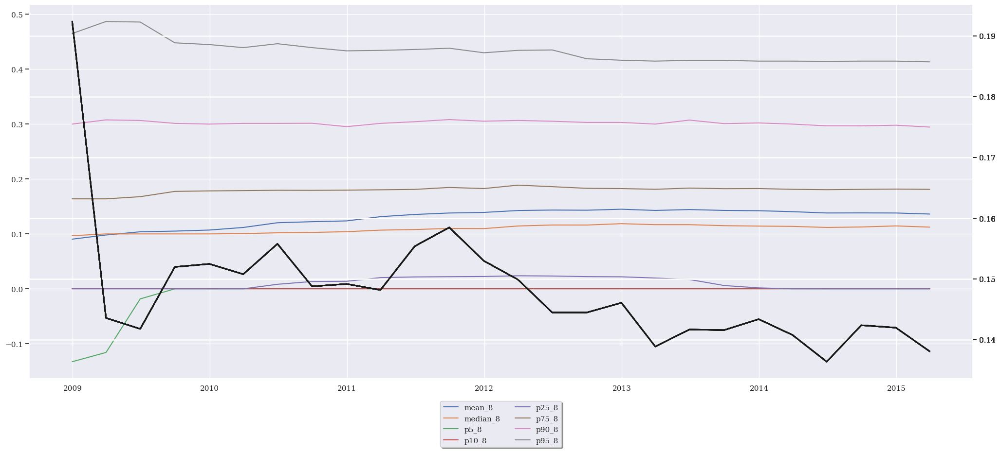

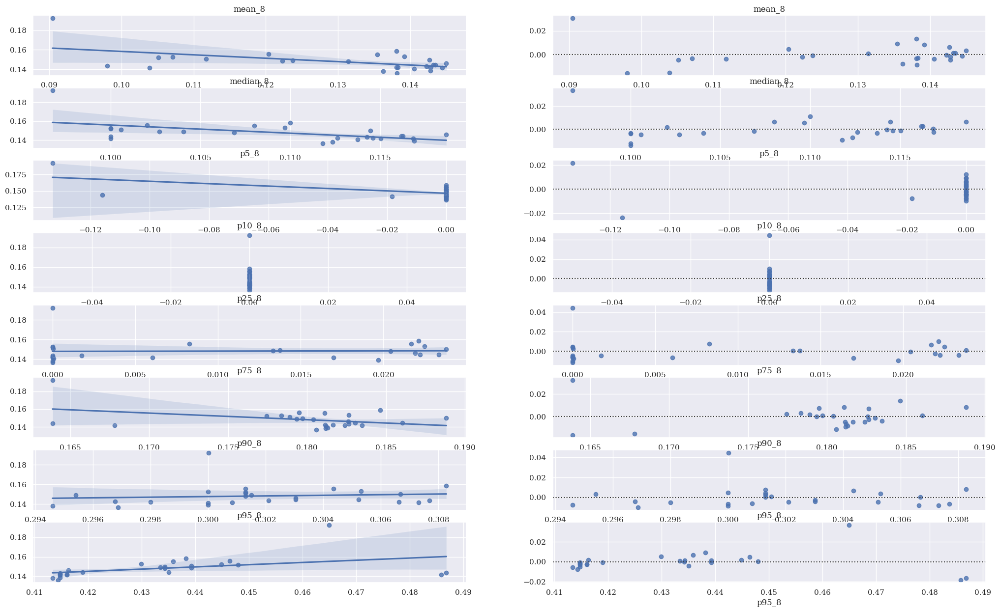

In [111]:
explo_portefeuille(df8,Y8,8)

## Type de client

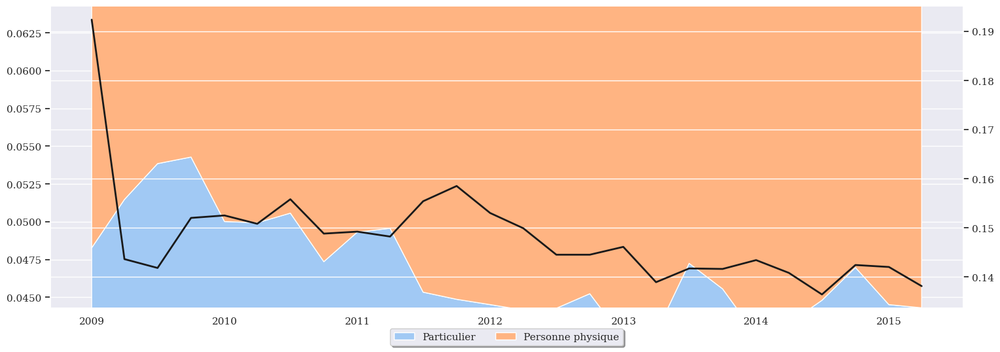

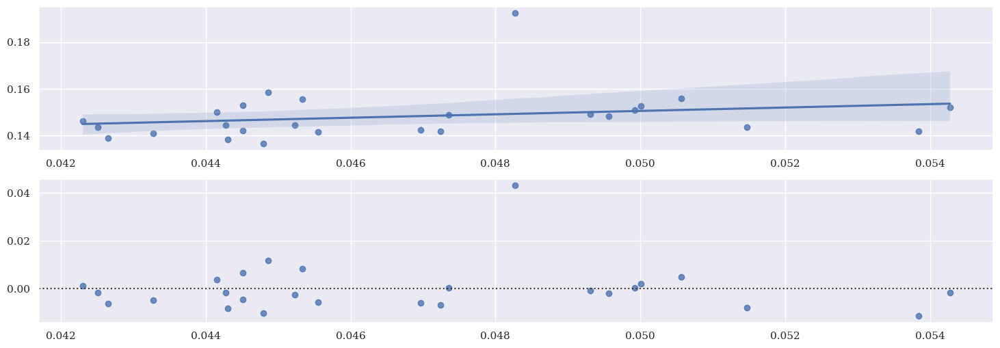

In [112]:
explo_client(df8,Y8)

## Mode d'habitation

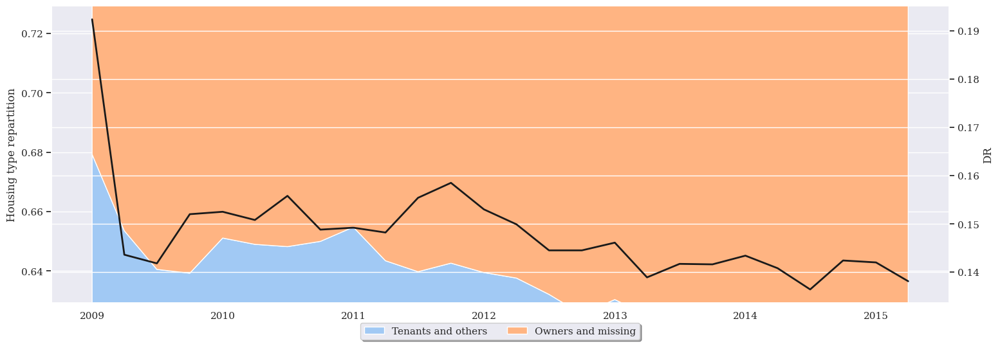

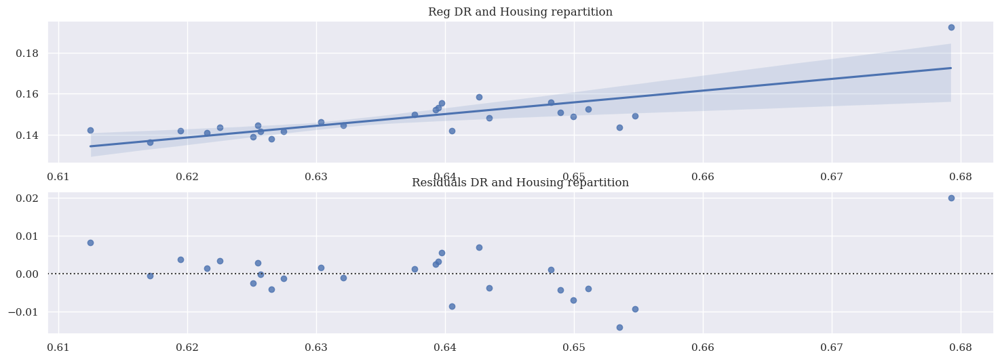

In [113]:
explo_habitation(df8,Y8)

## Etat civil

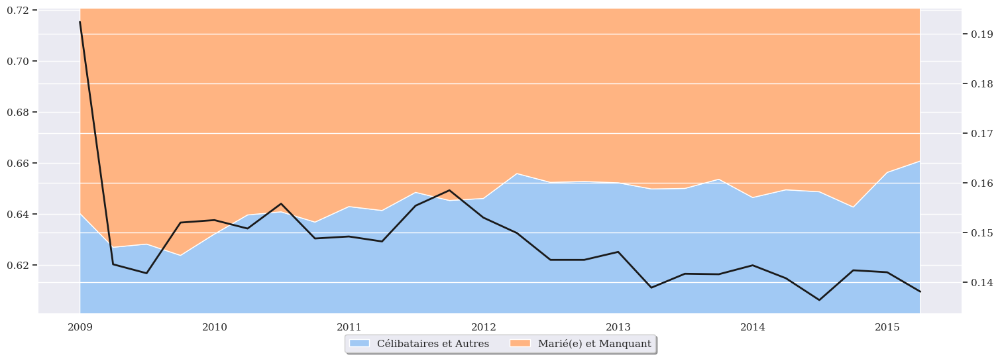

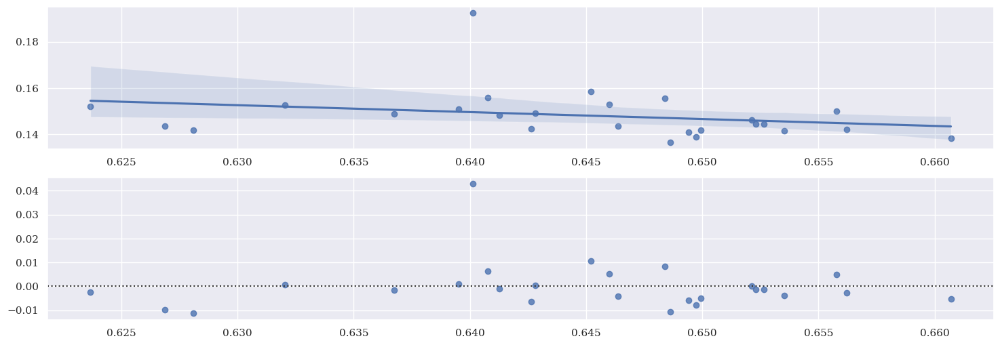

In [114]:
explo_civil(df8,Y8)

## Code qualité du véhicule

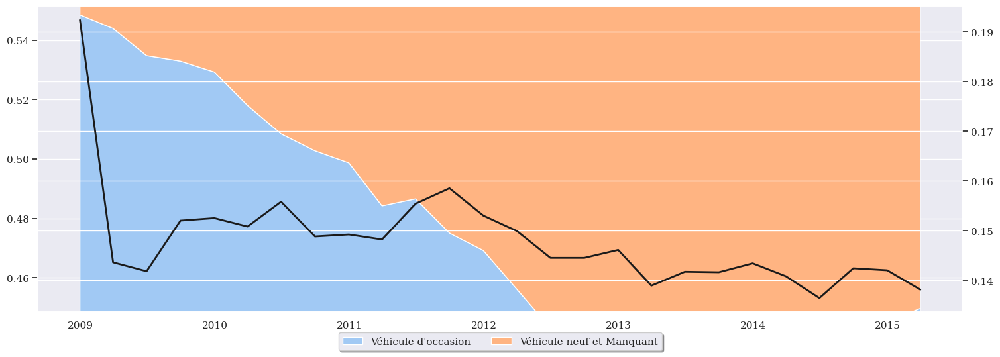

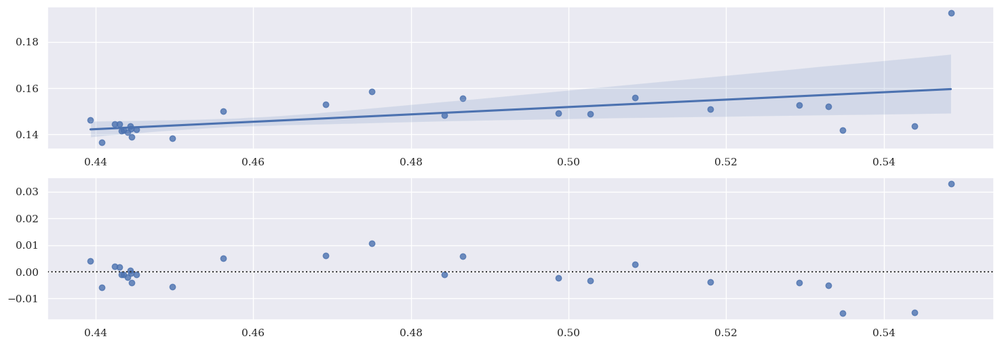

In [115]:
explo_code_qualite(df8,Y8)

## Profession

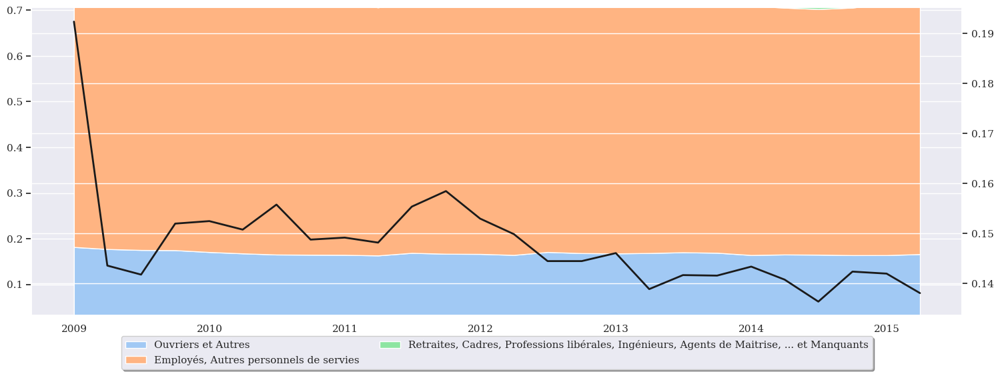

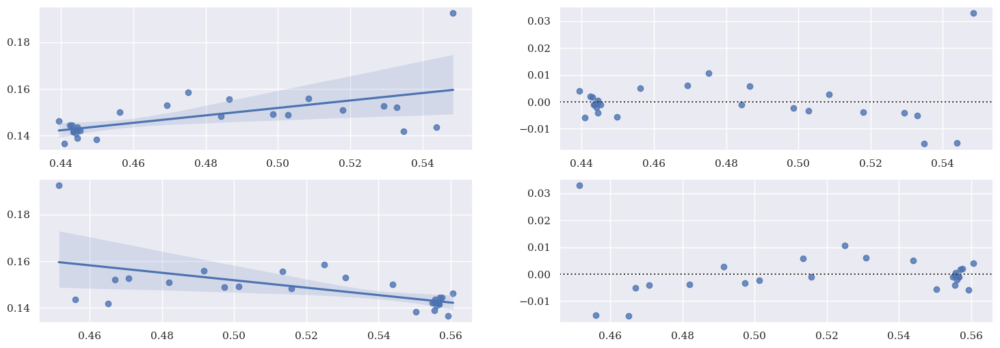

In [116]:
explo_profession(df8,Y8)

## Macro

**About PIB**

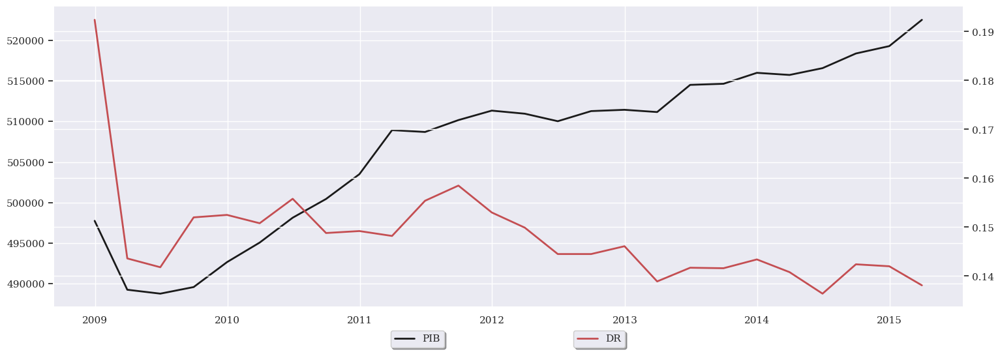

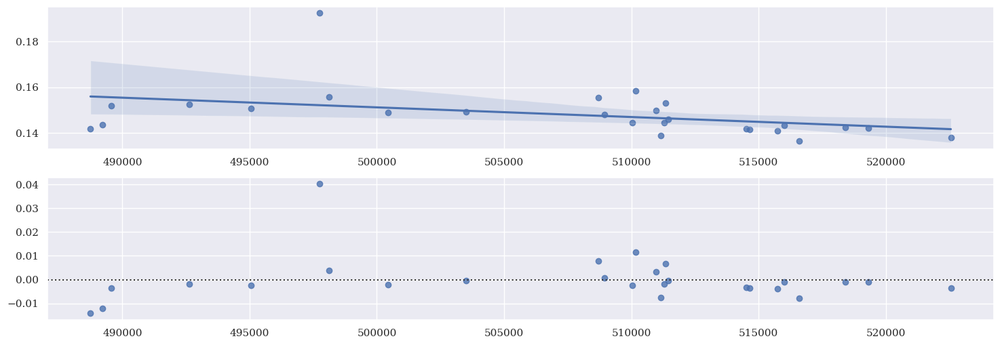

In [117]:
explo_pib(df8,Y8)

**About Inflation**

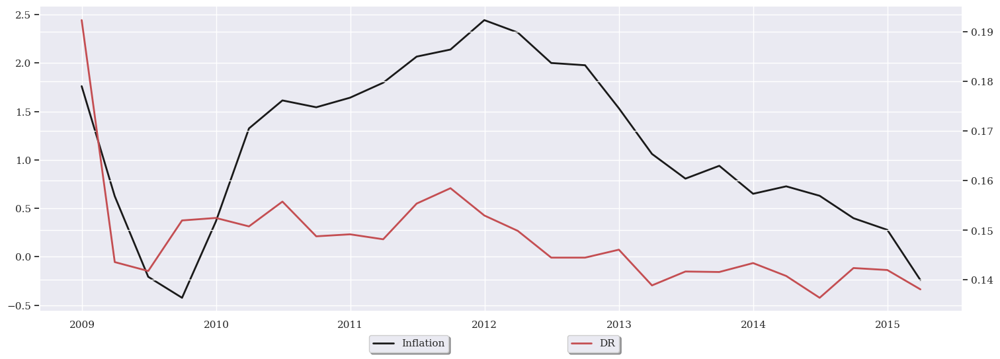

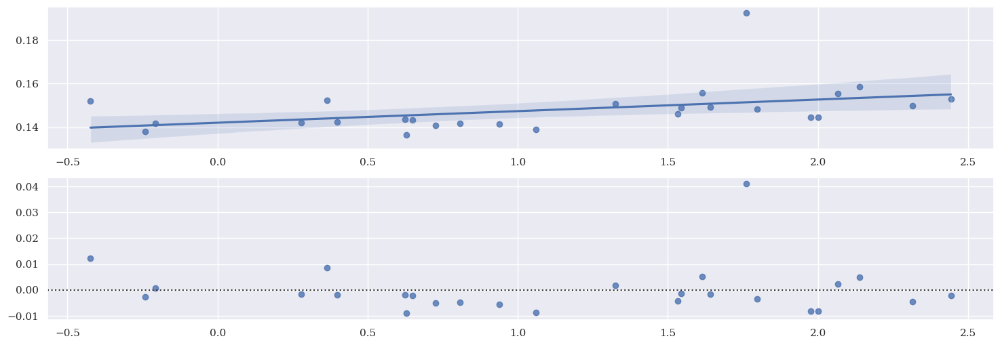

In [118]:
explo_inflation(df8,Y8)

**Taux chomage**

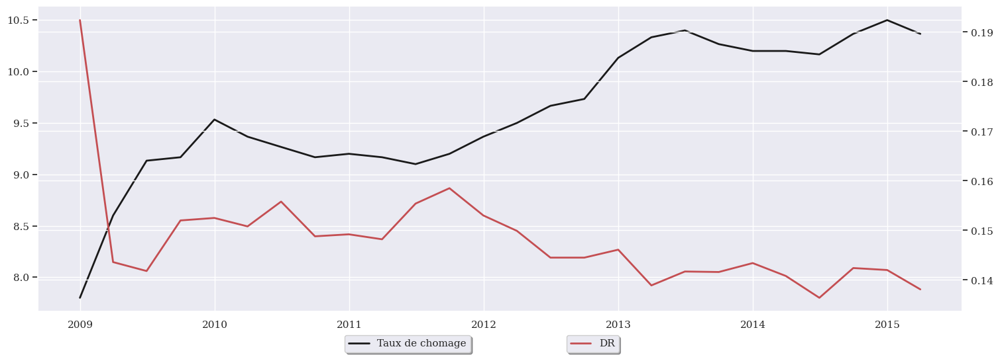

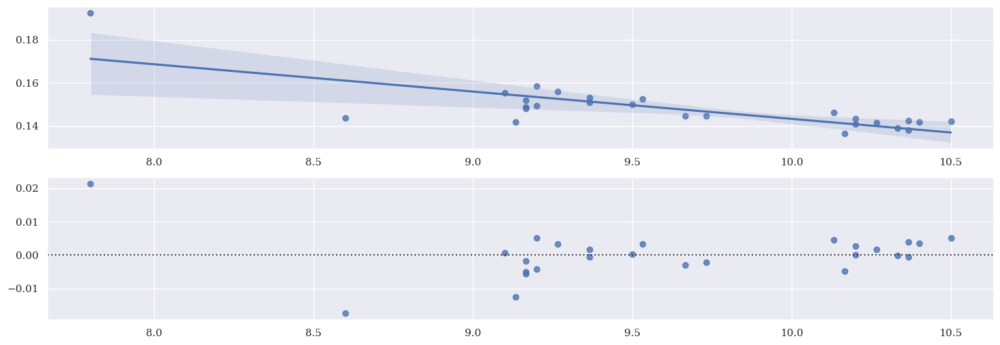

In [119]:
explo_txcho(df8,Y8)

# Exploration chronique totale

## Exploration DR

count    26.000000
mean      0.017204
std       0.001927
min       0.014500
25%       0.016325
50%       0.016650
75%       0.018300
max       0.024000
Name: DR, dtype: float64


c:\Users\arthu\OneDrive\Documents\DRiM\DrimGame2022\DreamLib\visualization.py:16: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(Y, fit=stats.norm, ax=axes[2])


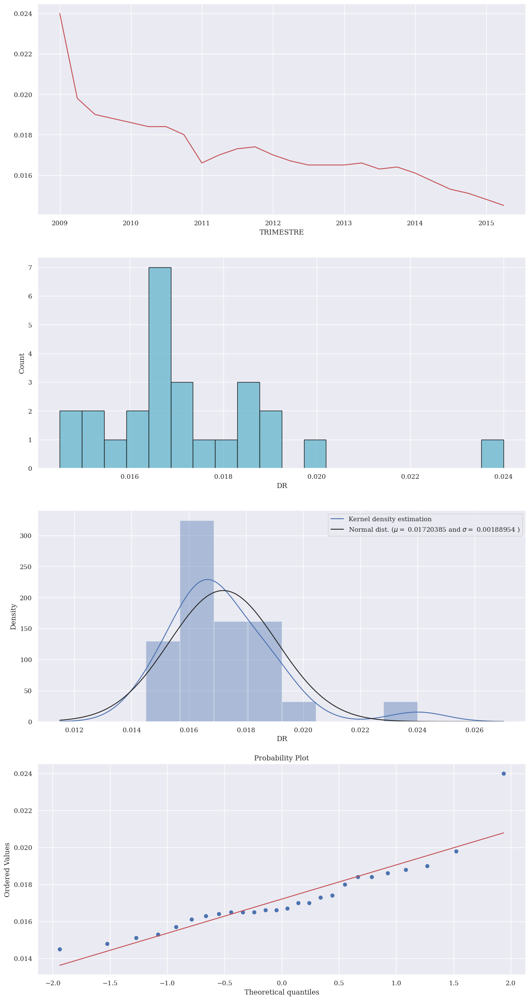

In [120]:
explo_DR(dft,Yt)

Pour CHR Totale, on observe que le taux de défaut diminue sur la totalité de l'horizon de temps. On remarque que la distribution des taux de défauts et la loi normale approximées sont relativement similaires. Ceci semble assez encourageant pour la suite. Cependant, nous ne pouvons pas appliquer des tests de stationnarité comme celui de Jarque-Bera car nous n'avons pas assez de données (moins de 2000). De plus, nous pouvons observer un outlier. Ce sera un enjeux important pour la suite de les supprimer. 

## Exploration portefeuille

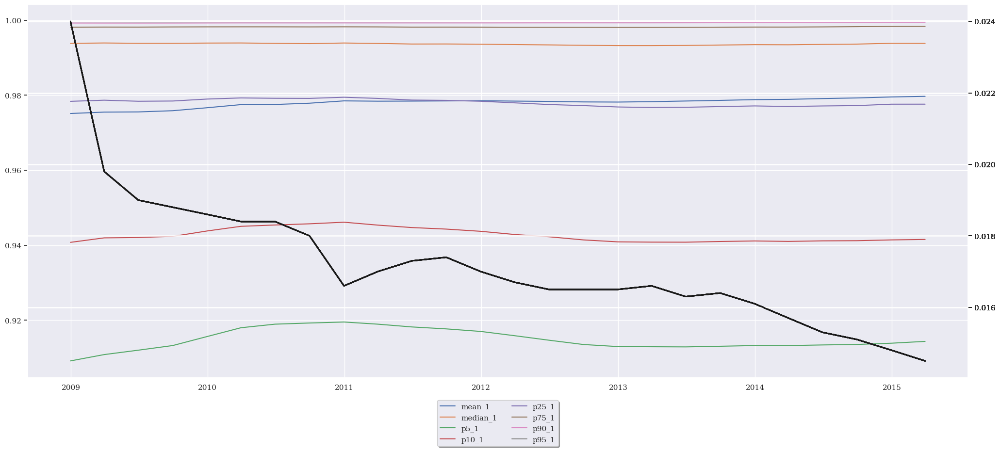

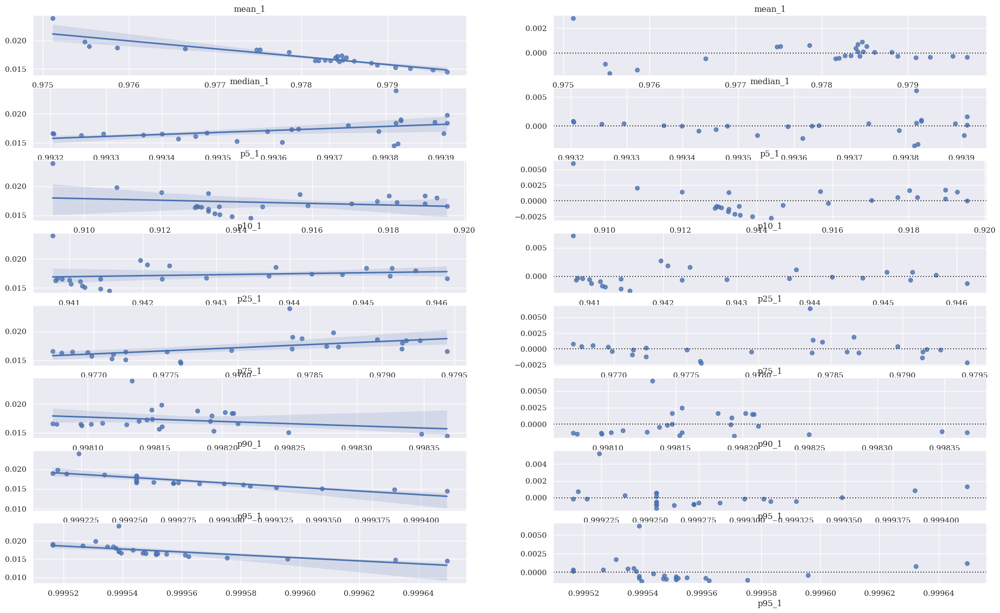

In [121]:
explo_portefeuille(dft,Yt,1)

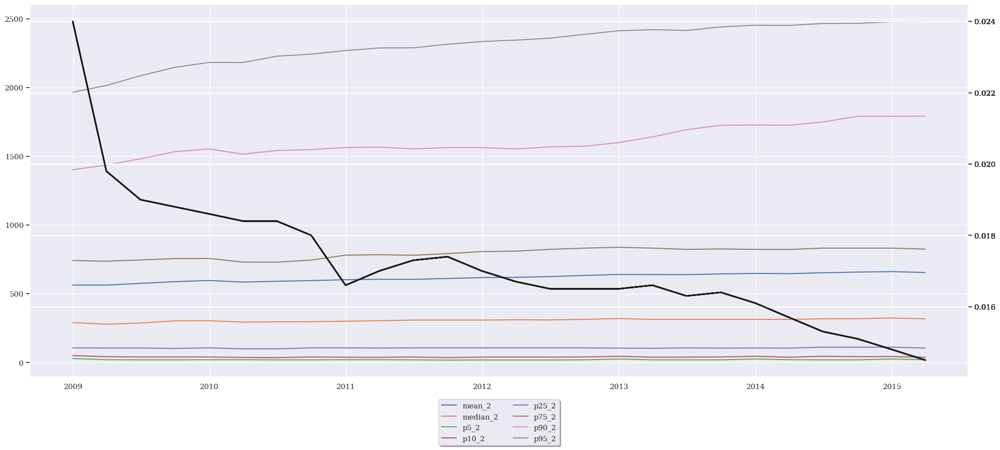

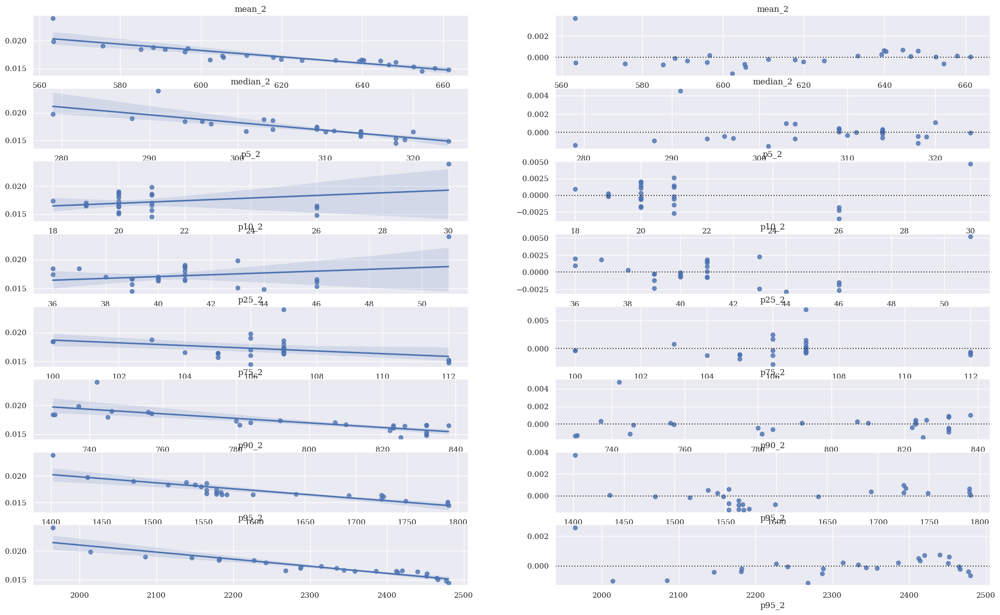

In [122]:
explo_portefeuille(dft,Yt,2)

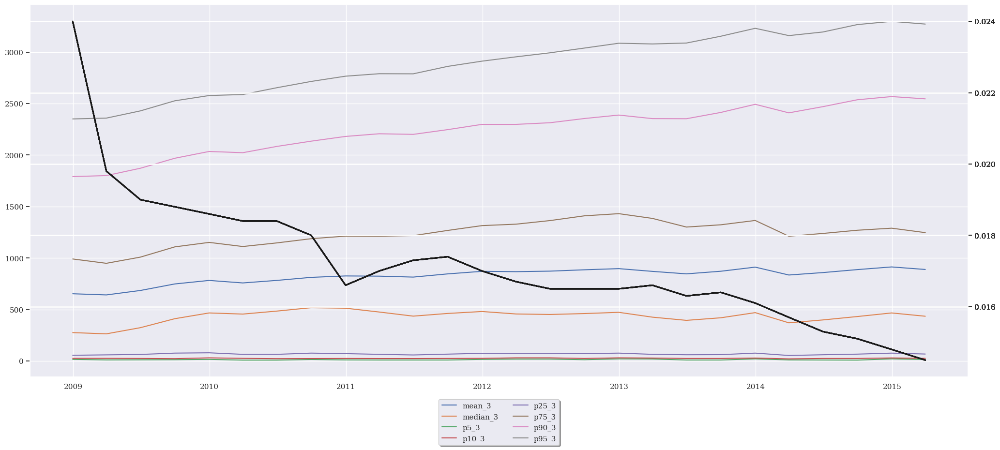

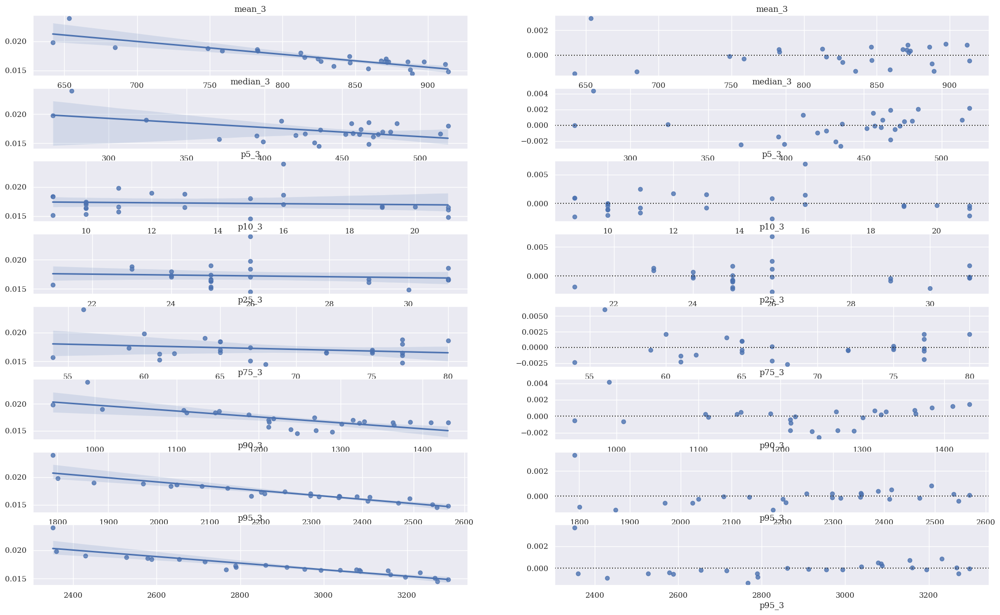

In [123]:
explo_portefeuille(dft,Yt,3)

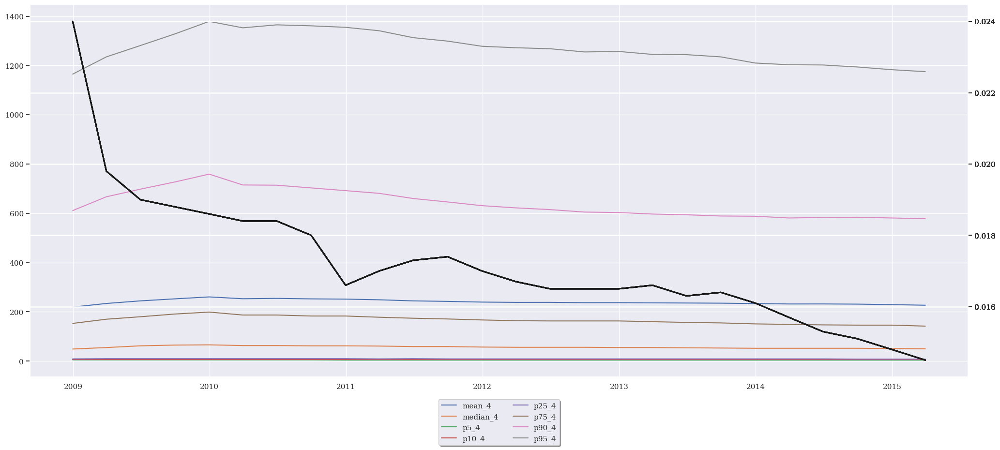

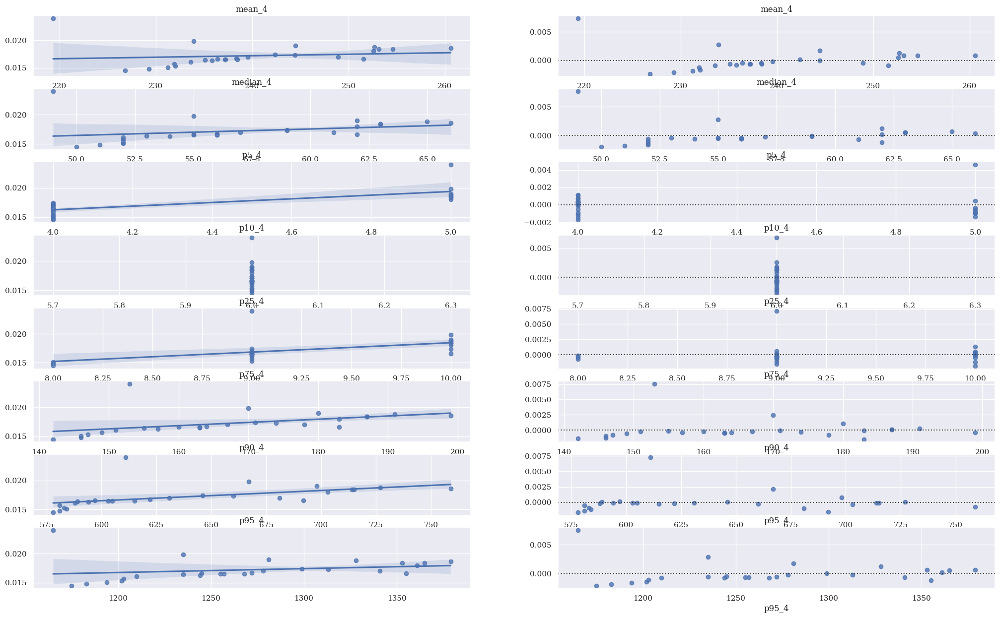

In [124]:
explo_portefeuille(dft,Yt,4)

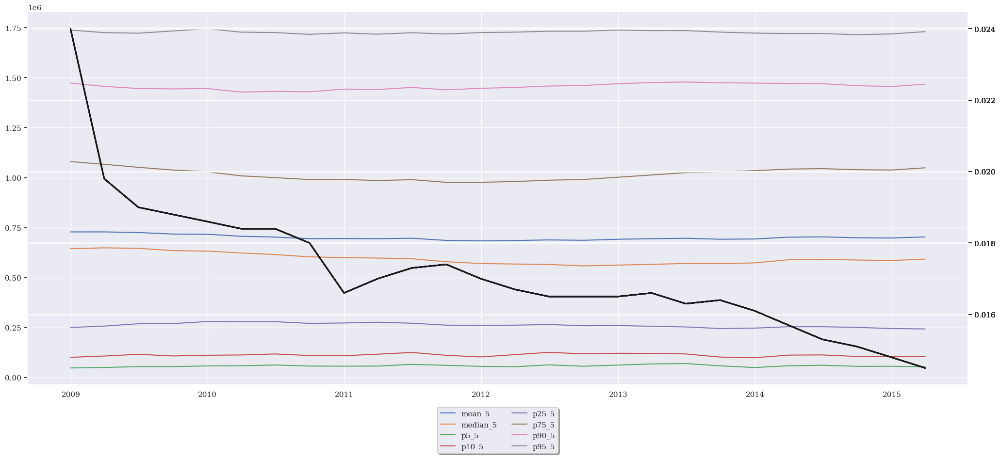

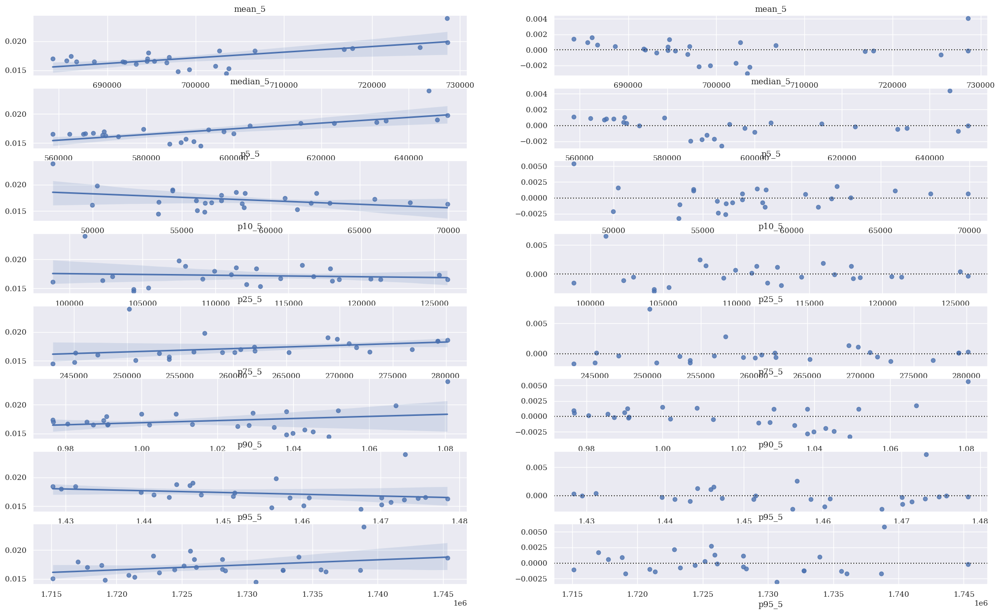

In [125]:
explo_portefeuille(dft,Yt,5)

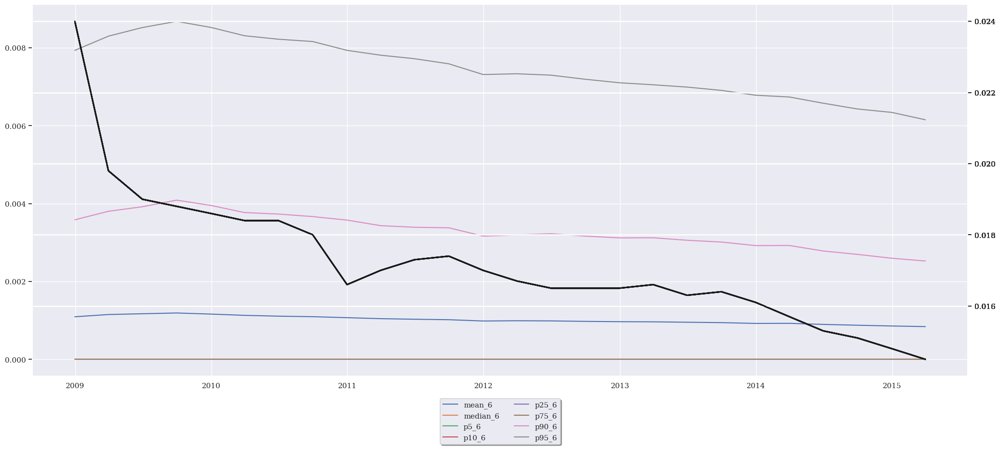

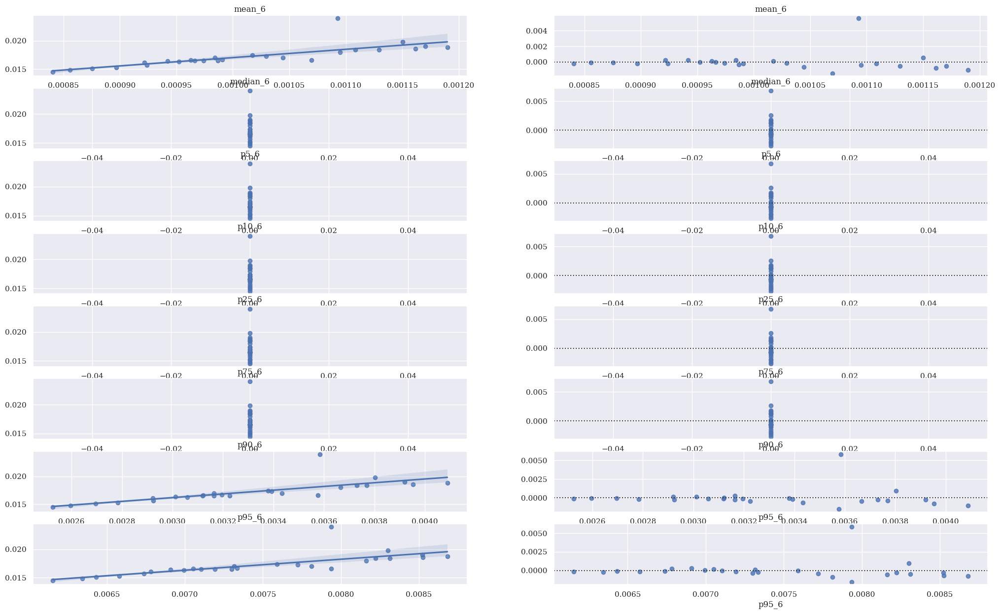

In [126]:
explo_portefeuille(dft,Yt,6)

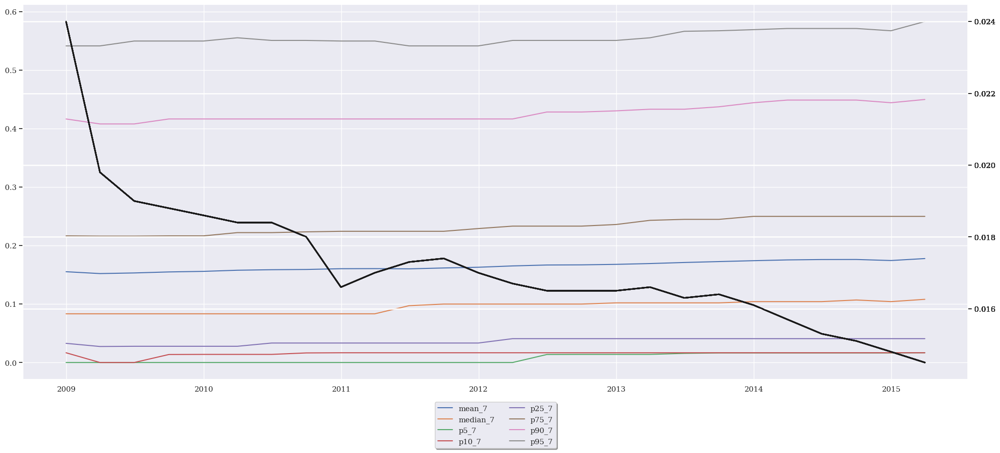

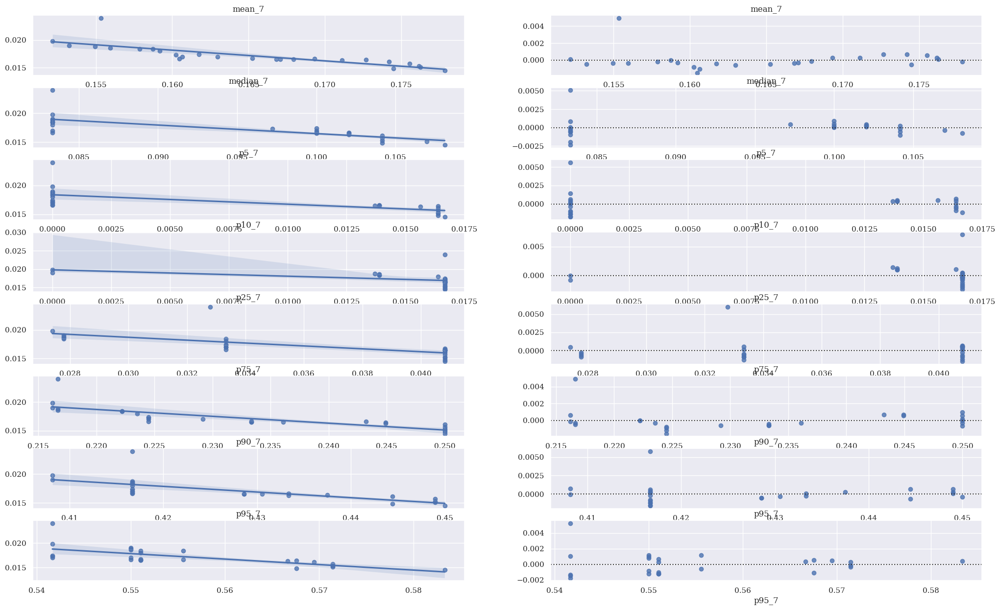

In [127]:
explo_portefeuille(dft,Yt,7)

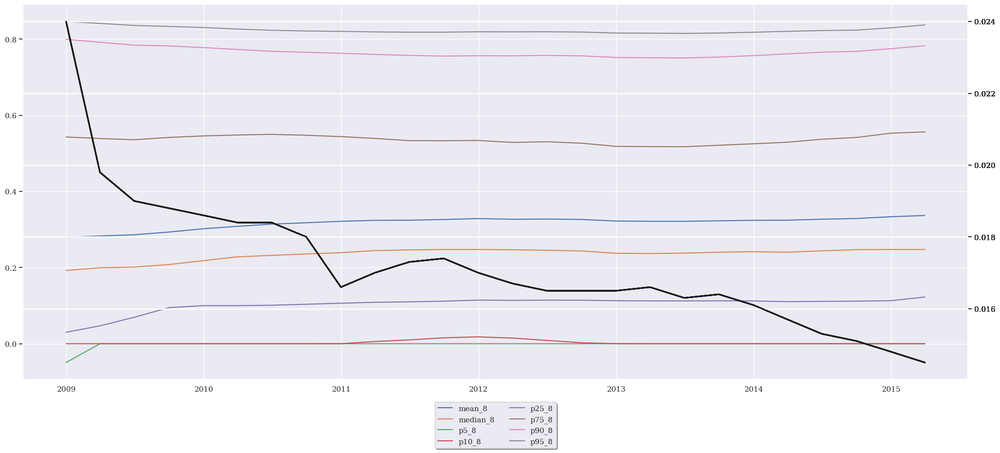

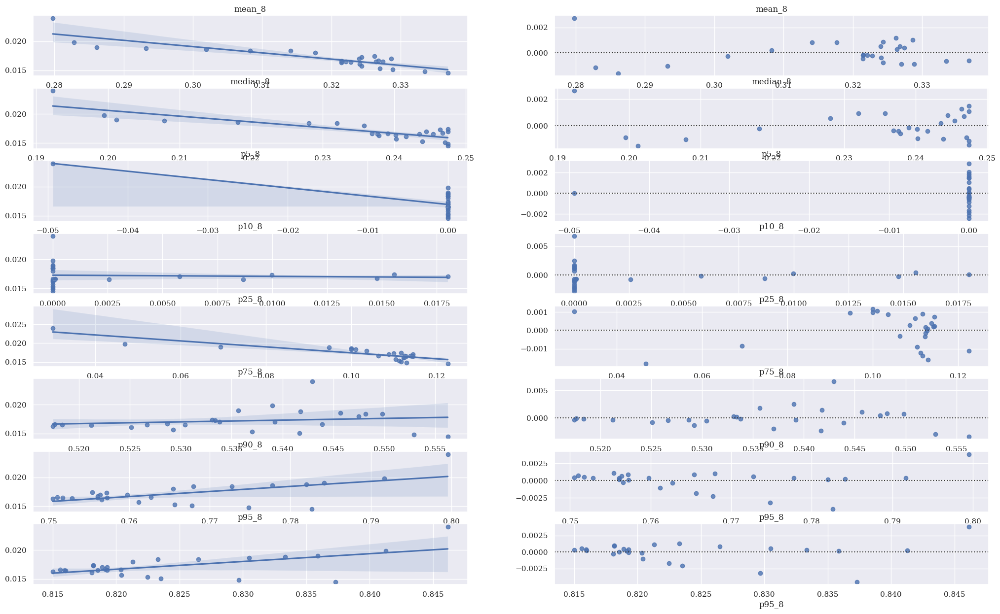

In [128]:
explo_portefeuille(dft,Yt,8)

## Type de client

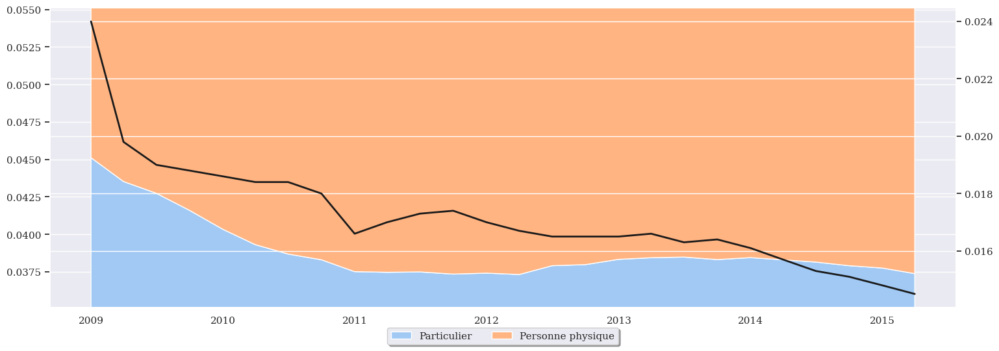

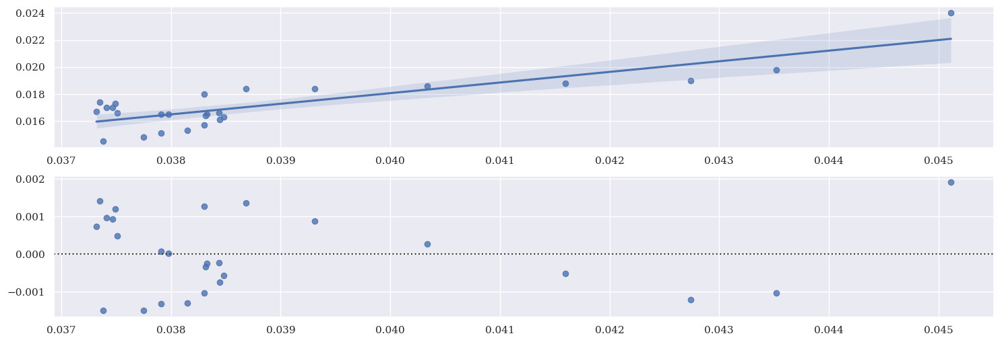

In [129]:
explo_client(dft,Yt)

## Mode d'habitation

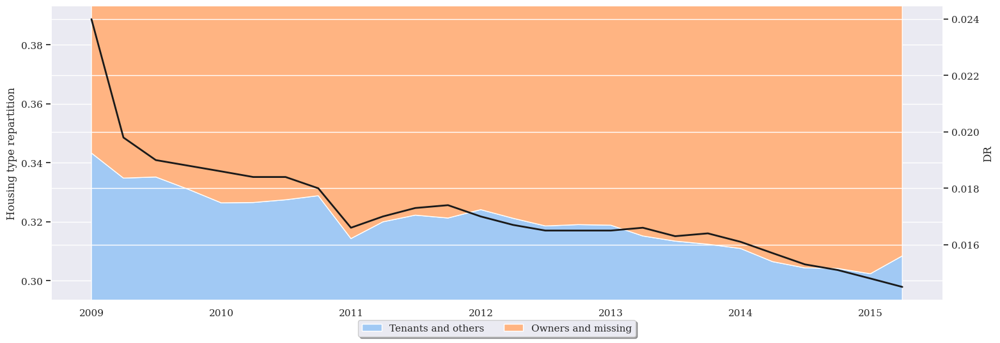

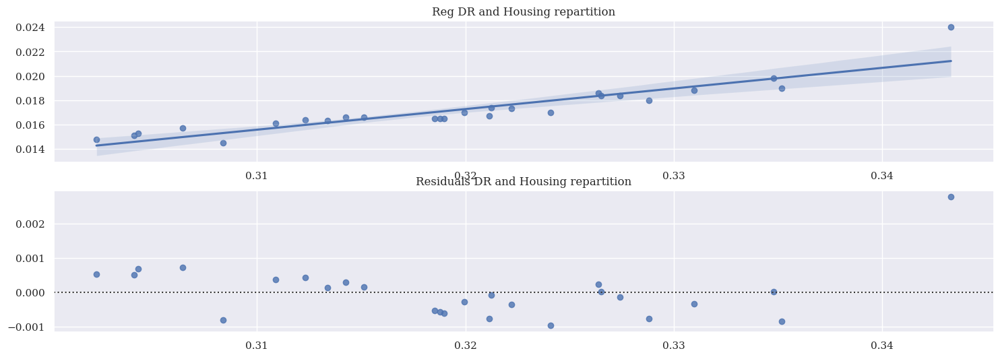

In [130]:
explo_habitation(dft,Yt)

## Etat civil

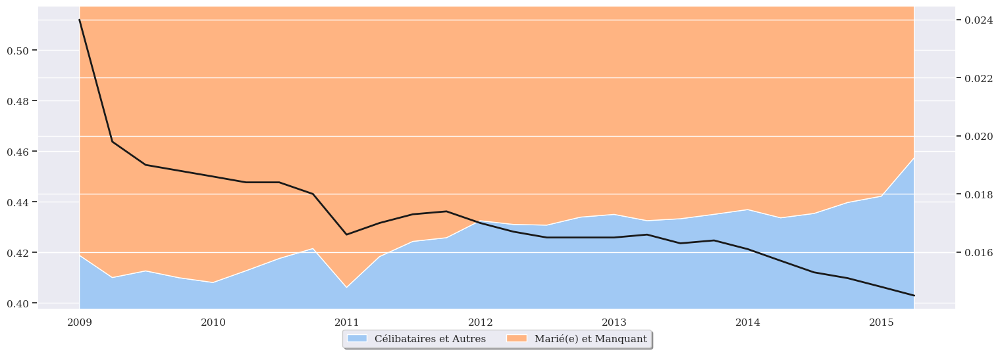

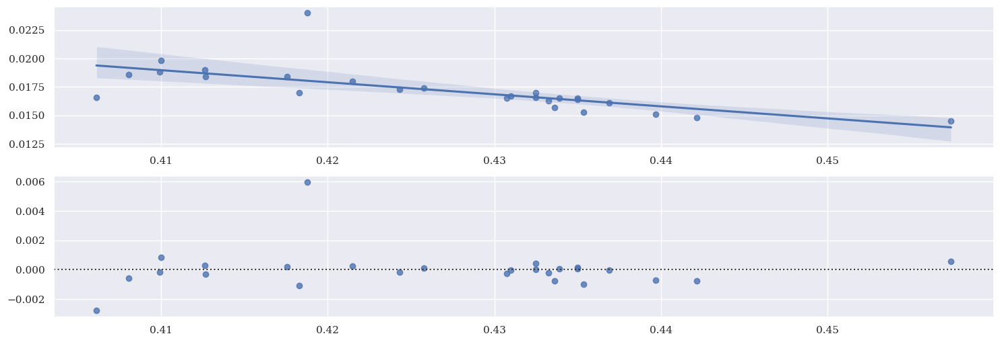

In [131]:
explo_civil(dft,Yt)

## Code qualité du véhicule

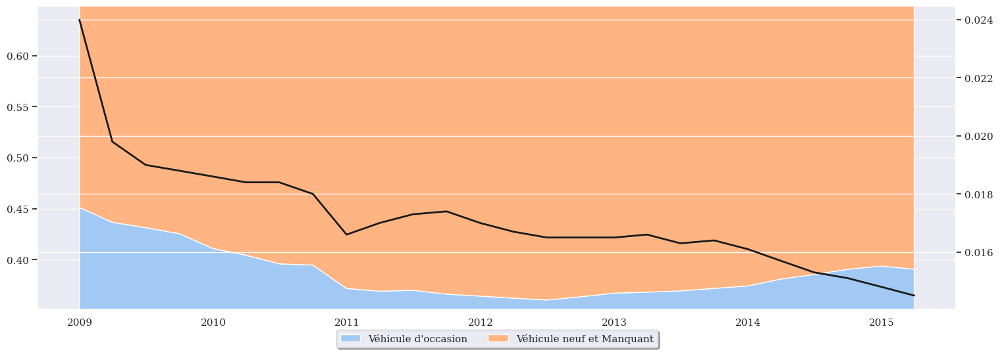

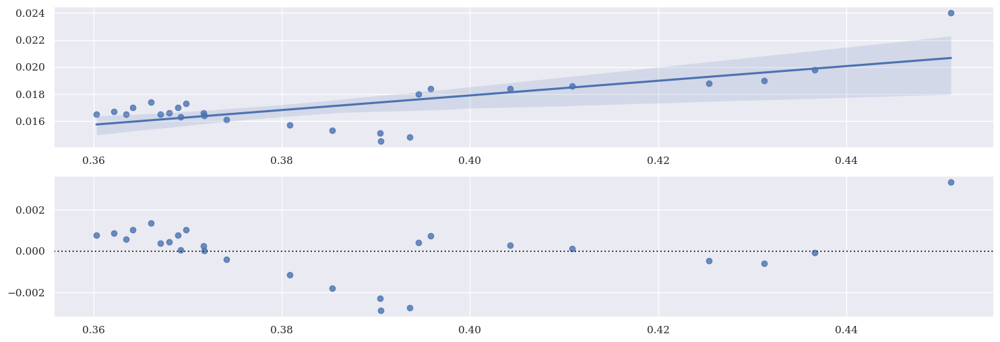

In [132]:
explo_code_qualite(dft,Yt)

## Profession

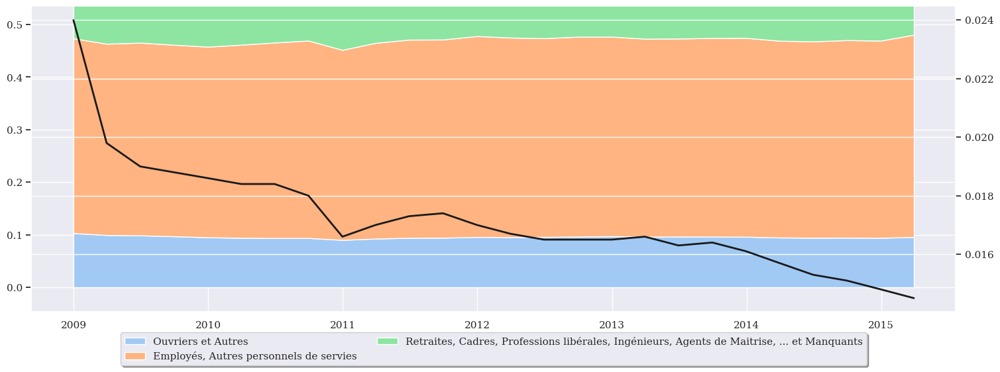

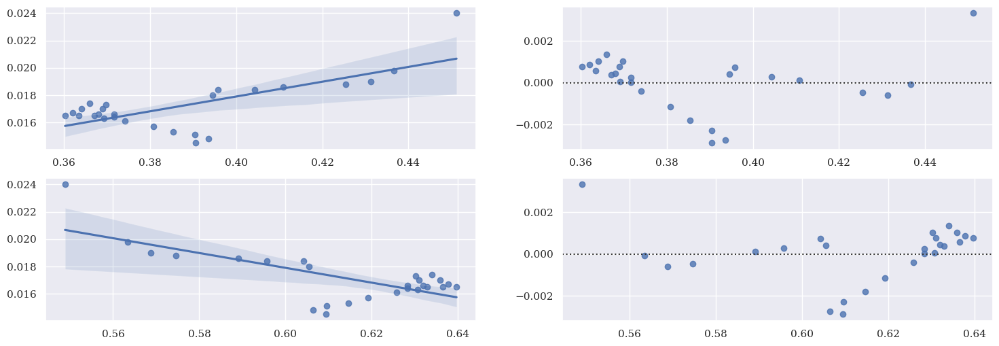

In [133]:
explo_profession(dft,Yt)

## Macro

**About PIB**

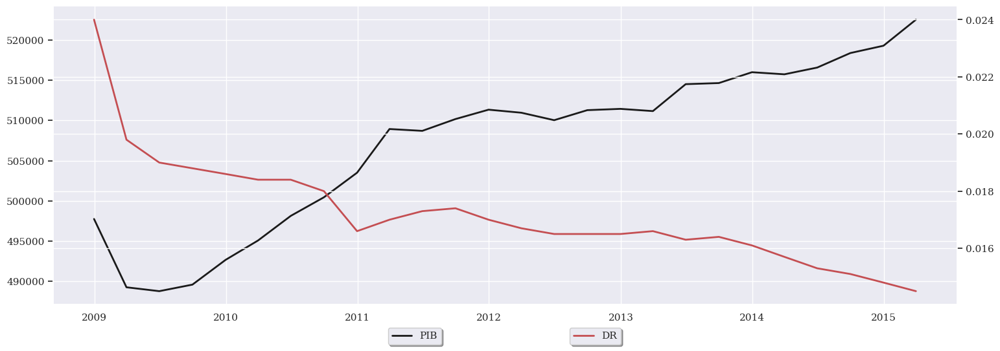

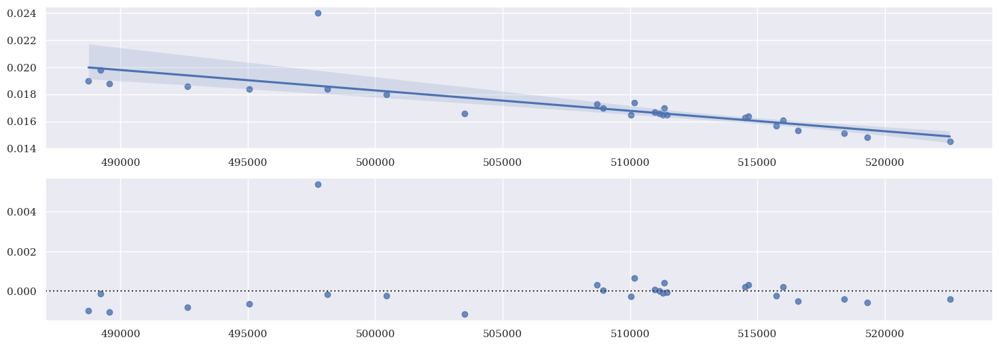

In [134]:
explo_pib(dft,Yt)

**About Inflation**

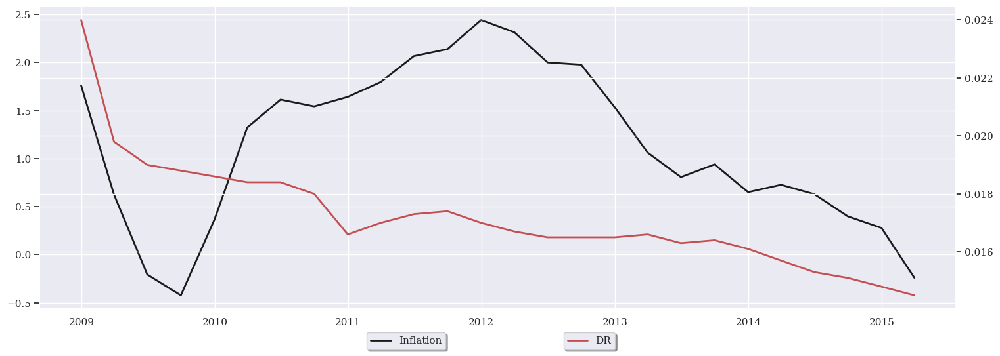

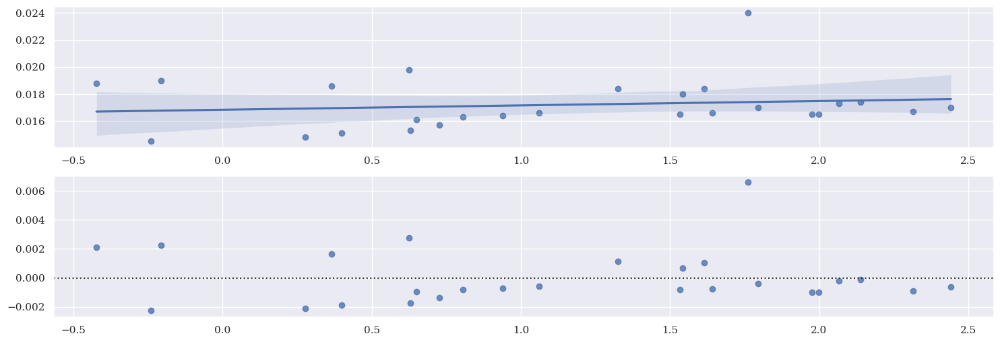

In [135]:
explo_inflation(dft,Yt)

**Taux chomage**

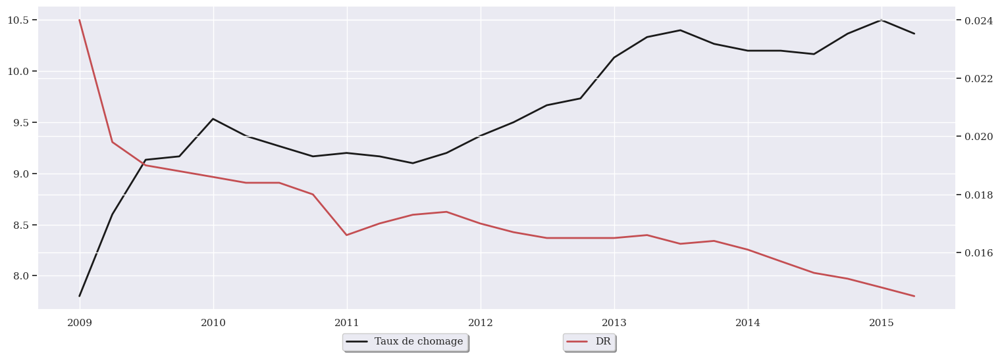

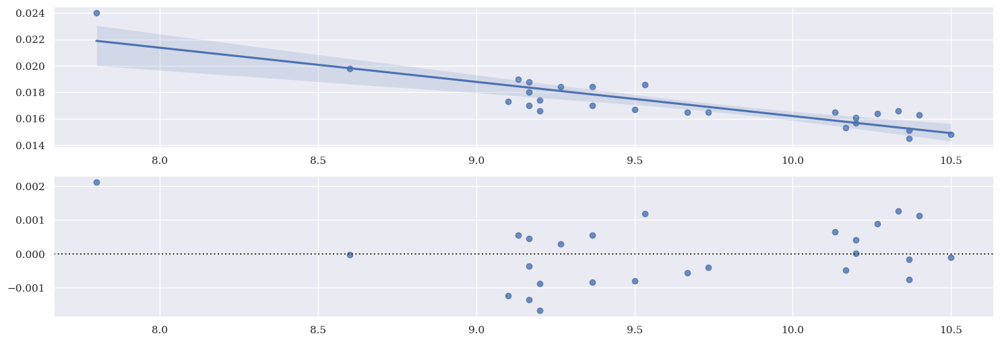

In [136]:
explo_txcho(dft,Yt)